In [1]:
#use wdtools_env_pip environment

import numpy as np
from math import log10, floor
from bisect import bisect_left
from scipy import stats
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors
plt.style.use('Software/stefan.mplstyle')

import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'

#for machine learning
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import load_model


# This notebook trains a machine learning method to reconstruct the correlation length in the simulation with all noise sources added and with reducing measurement noise by order of magnitude (improvement_factor=10)(simulation=9)
- Use a deep learning approach with a convolutional neural network. CNNs are designed to automatically learn hierarchical features from raw data (usually images), so they are well suited to detect the peak/drop-off structure in the Moran's I x Z-Score curve that is useful in identifying the correlation length without me needing to do manual feature extraction. 
    - Use just the 1D Moran's I x Z-Score curve, don't include the distance array since the CNN will learn that scale from the labeled true correlation length
    - Don't cut the peak at small distances since the CNN should learn that feature doesn't necessarily drive the labeled true correlation length

# Import the simulation outputs

In [2]:
def get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type,nonzero_weight_cut=20,plot=True):
    #read back in measurements
    noise_label="".join(noise_effect_array)
    
    #sample_type='training','testing', or 'bootstrap'
    if sample_type=='training':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']
        
    if sample_type=='testing':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']

    Ws = npzfile['Ws']
    final_distances = npzfile['distances']
    moransIs = npzfile['moransIs'] 
    expectations = npzfile['expectations']
    variances = npzfile['variances']
    zscores = npzfile['zscores']
    
    mult=[]
    for i in range(len(moransIs)):
        mult.append(moransIs[i]*zscores[i])
        
    #cut to make sure have enough nonzero weights for valid results
    index = bisect_left(Ws, nonzero_weight_cut)
    
    if plot:
        #plot
        fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(6,15),sharex=True)
        ax1.plot(final_distances,moransIs)
        ax1.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax1.axvline(corr_length,color='green',label='True Correlation\nLength')
        ax1.axhline(expectations[0],color='red',label='No Correlation')
        ax1.set_ylabel("Moran's I")
        ax1.legend()

        ax2.plot(final_distances,zscores)
        ax2.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax2.axvline(corr_length,color='green')
        ax2.set_ylabel('Z-score')

        ax3.plot(final_distances,mult)
        ax3.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax3.axvline(corr_length,color='green')
        ax3.set_xlabel('Distance Cut')
        ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

        plt.subplots_adjust(wspace = 0,hspace=0)
        plt.show()
    
    return(final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index)


In [3]:
def count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type):
    
    #turn into combined simulation parameter array
    simulation_params=[]
    for corr_length in corr_lengths:
        for epsilon in epsilons:
            simulation_params.append([corr_length,epsilon])
            
    noise_label="".join(noise_effect_array)
    
    simulation_params_not_run=[]
    simulation_params_run=[]
    
    #check if each training data simulation has been run
    for i in range(len(simulation_params)):
        simulation=simulation_params[i]
        corr_length=simulation[0]
        epsilon=simulation[1]
        try:
            if sample_type=='training':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            if sample_type=='testing':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            simulation_params_run.append(simulation)
            #print('Simulation exists, ', simulation)
        except:
            simulation_params_not_run.append(simulation)
            #print('No simulation exists, ', simulation)

    return(simulation_params_run,simulation_params_not_run)


In [4]:
#for training data
corr_lengths=np.round(np.append(np.linspace(1,98,30)[1:],np.logspace(2,3,num=100)[1:-1]),2)
def round_sig(x,sig):
    return round(x, sig-int(floor(log10(abs(x))))-1)
epsilons_init=np.append(np.logspace(-10,-1,num=20),np.linspace(0.1,0.5,4)[1:])
epsilons=[]
for e in epsilons_init:
    epsilons.append(round_sig(e,2))

#for testing data
corr_lengths_testing=[10,25,50,75,100,150,200,250,300,400,500,600,700,800,900,1000]
epsilons_testing=[1e-10,1e-7,1e-4,0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [5]:
sample_size=10207
noise_effect_array=['1','1','1','1','1']
improvement_factor=10
effect_strength=1
chance_companion=0.01
remove_likely_binaries='1'

#count how many simulations have been run

simulation_params_run,simulation_params_not_run=count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

print('training')
print(len(simulation_params_run))
print(len(simulation_params_not_run))
print('')

simulation_params_run_testing,simulation_params_not_run_testing=count_simulations(corr_lengths_testing,epsilons_testing,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'testing')
print('testing')
print(len(simulation_params_run_testing))
print(len(simulation_params_not_run_testing))

training
2921
0

testing
256
0


385.35 0.034


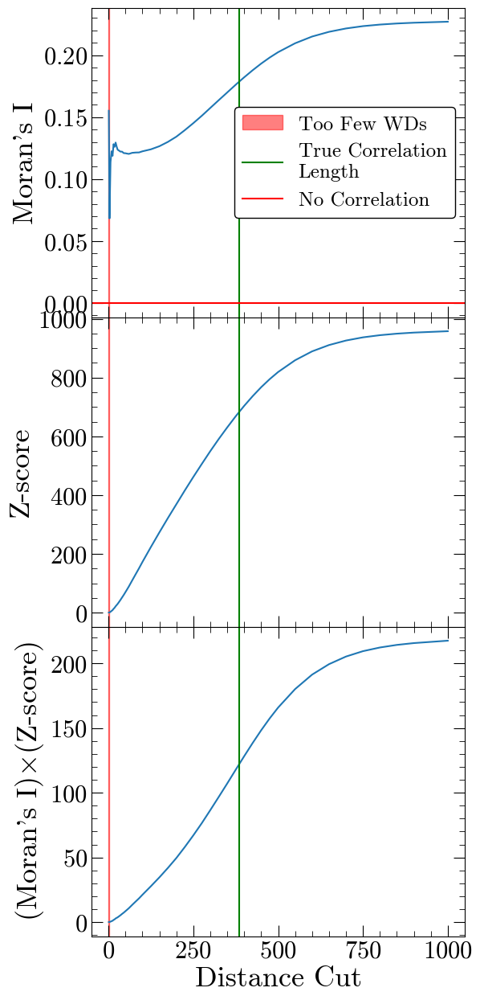

422.92 7e-08


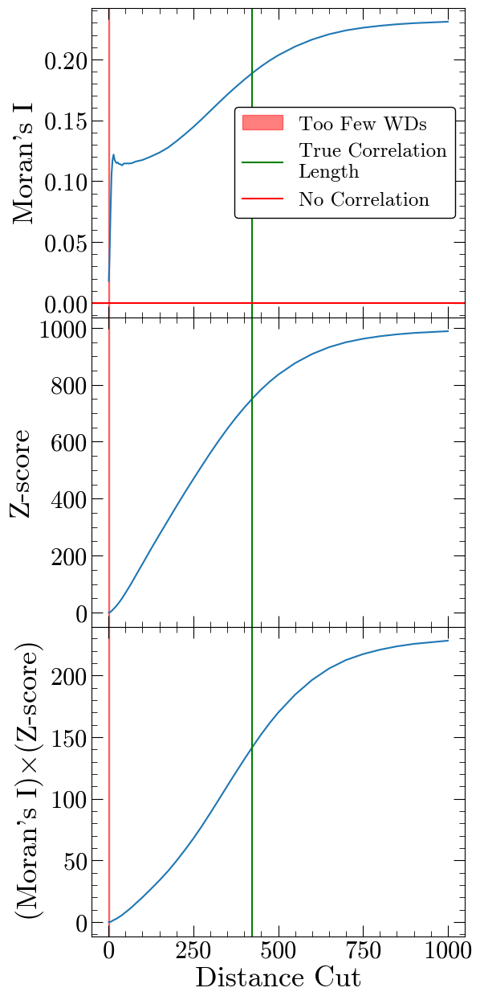

17.72 0.0038


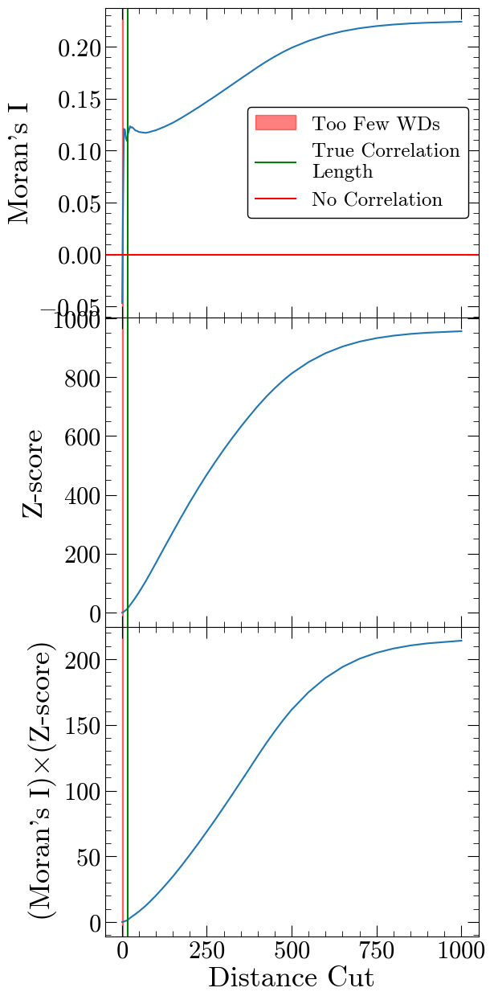

403.7 2.6e-09


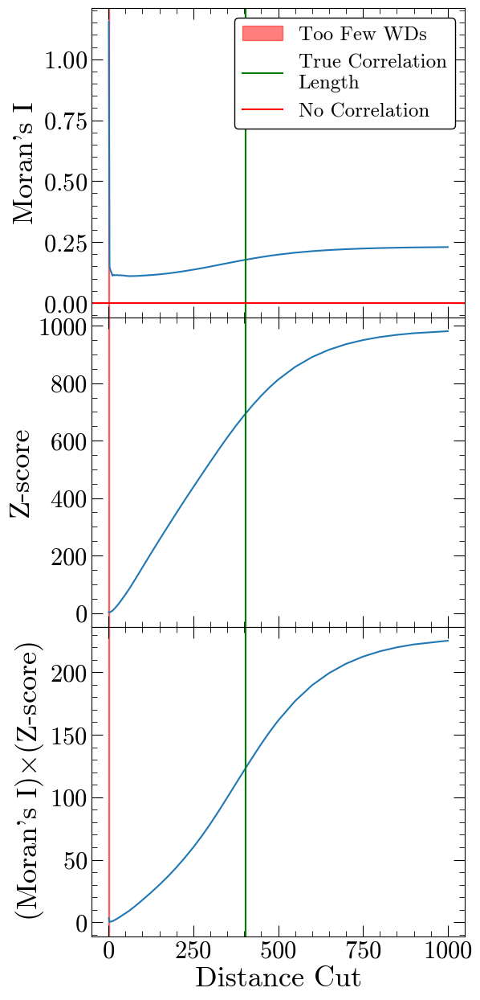

27.76 7.8e-09


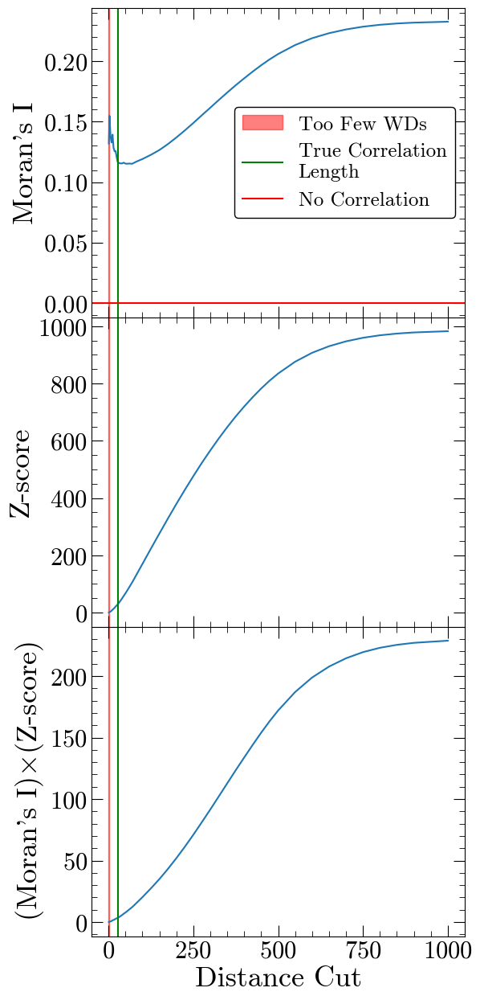

67.9 0.1


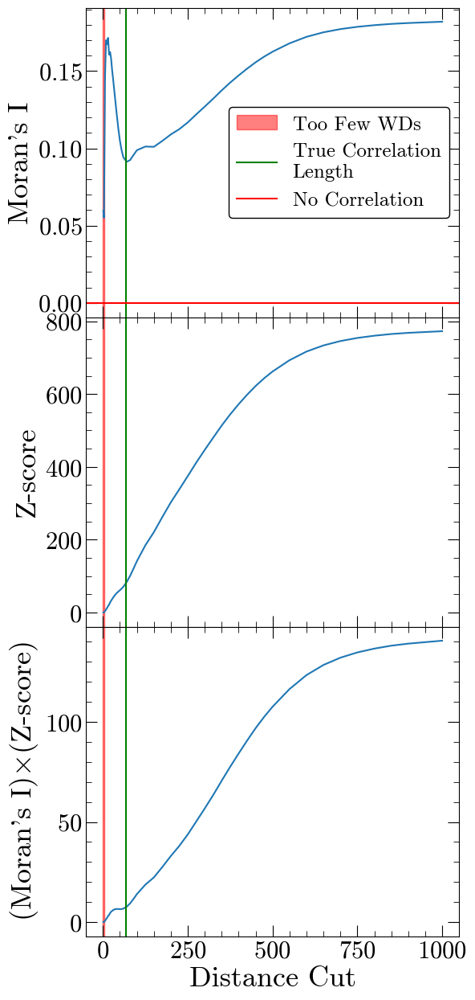

278.26 0.37


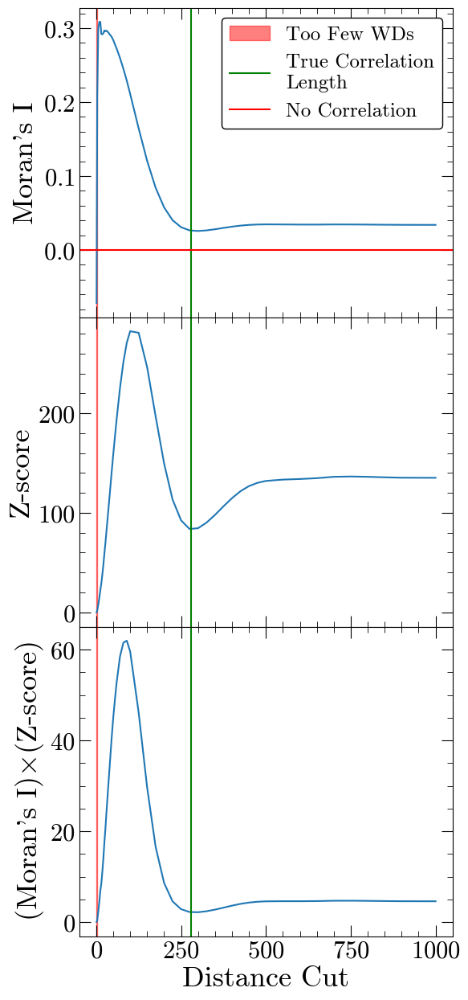

54.52 4.8e-05


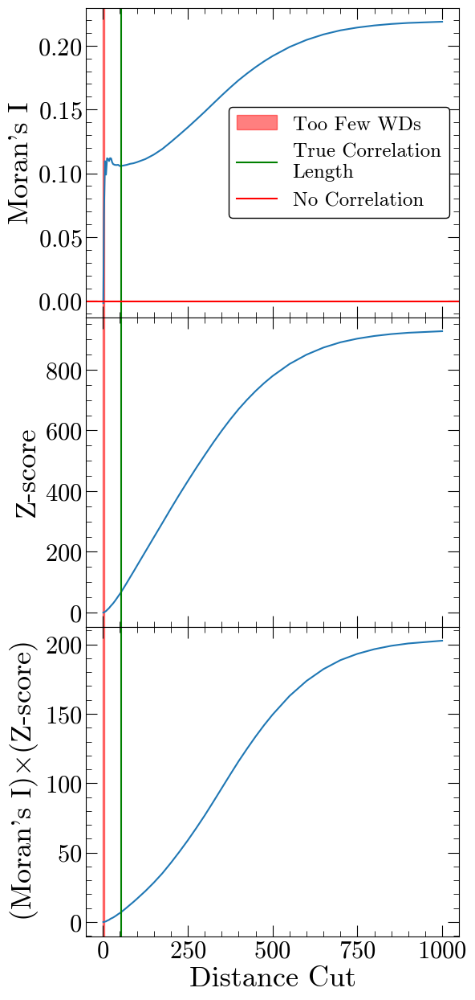

104.76 1.6e-05


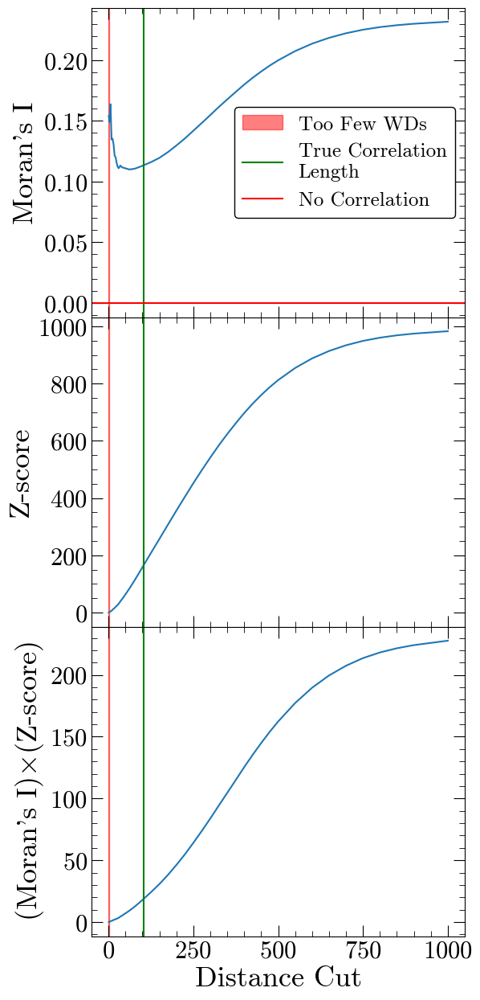

196.3 5.5e-06


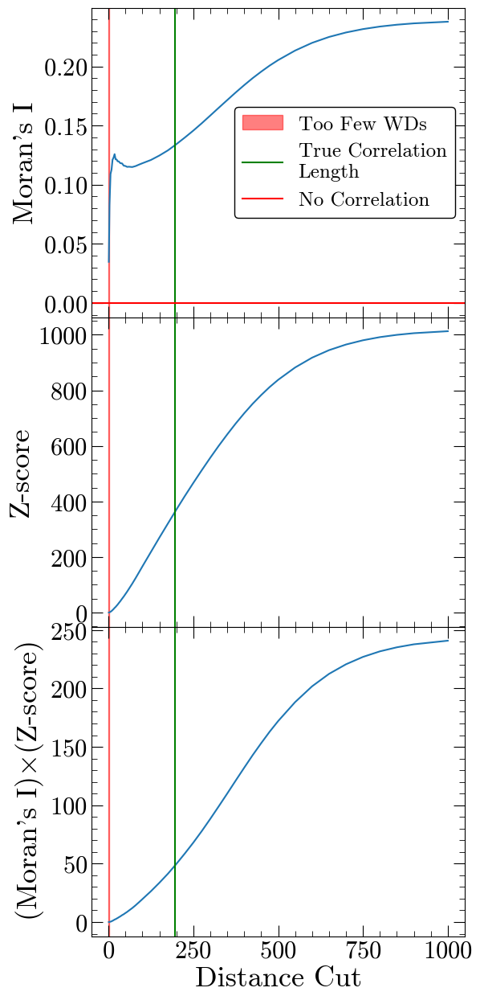

In [6]:
#display a few curves from the training data set
indices=np.random.randint(len(simulation_params_run), size=10)
for index in indices:
    corr_length=simulation_params_run[index][0]
    epsilon=simulation_params_run[index][1]
    print(corr_length,epsilon)
    sample_size=10207
    output=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

# Make a representative plot of various epsilons and correlation lengths

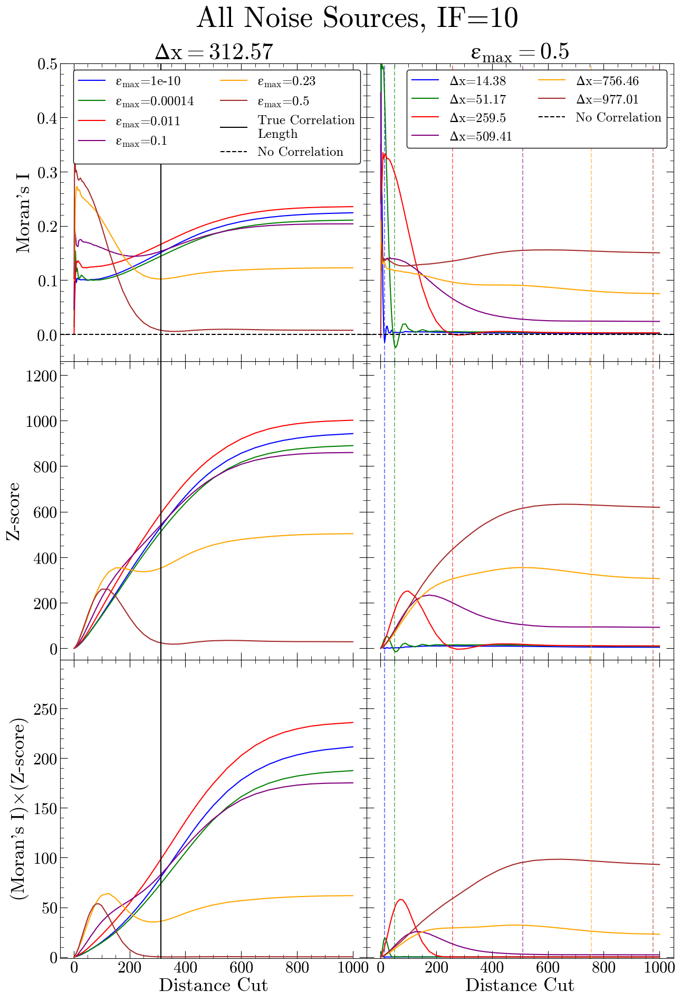

In [7]:
fig, ((ax1,ax4),(ax2,ax5),(ax3,ax6)) = plt.subplots(3,2,figsize=(15,22),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,0.00014,0.011,0.1,0.23,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon_{max}$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    
#One epsilon length, various correlation lengths
epsilon=0.5
corr_lengths_subset=[14.38, 51.17, 259.5, 509.41, 756.46, 977.01]
for i in range(len(corr_lengths_subset)):
    corr_length=corr_lengths_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax4.plot(final_distances,moransIs,color=color,label='$\Delta x$='+str(corr_length))
    ax4.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax5.plot(final_distances,zscores,color=color)
    ax5.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax6.plot(final_distances,mult,color=color)  
    ax6.axvline(corr_length,color=color,linestyle='--',alpha=0.5)

ax4.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax4.legend(ncol=2,loc='upper right')

ax6.set_xlabel('Distance Cut')

ax4.set_title('$\epsilon_{max}=$'+str(epsilon))

#clean up the plot
ax1.set_ylim(-0.05,0.5)
ax4.set_ylim(-0.05,0.5)

ax2.set_ylim(-50,1260)
ax5.set_ylim(-50,1260)

ax3.set_ylim(-1,299)
ax6.set_ylim(-1,299)

ax4.set_yticklabels([]) 
ax5.set_yticklabels([]) 
ax6.set_yticklabels([]) 

fig.suptitle('All Noise Sources, IF=10', fontsize=40, x=0.5, y=0.93)
plt.subplots_adjust(wspace = 0,hspace=0)

plt.savefig('curves_all_noise_IF10.pdf', dpi=300)#, pad_inches=0.3)

(-0.02, 80.0)

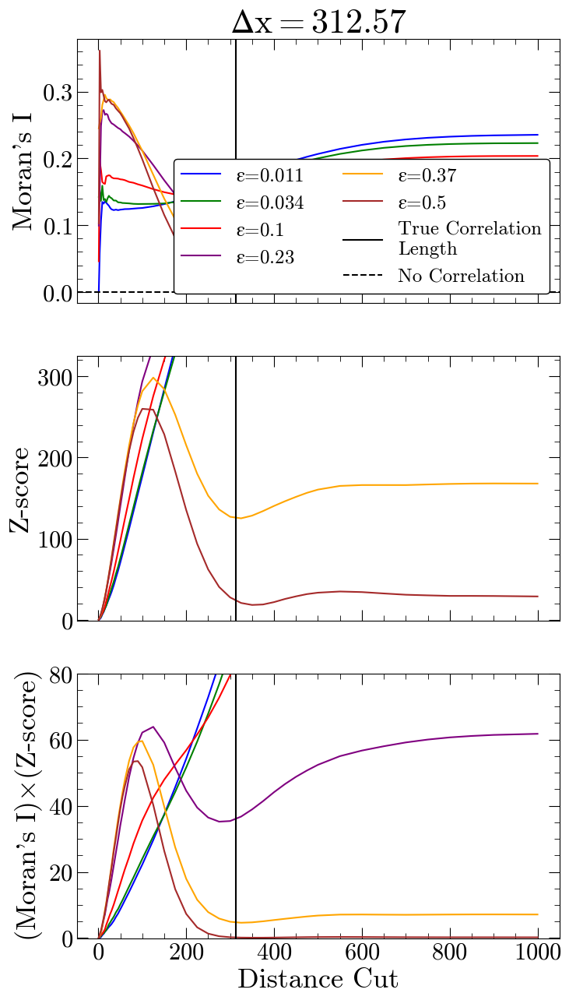

In [26]:
#find minimum visible epsilon

#min=0.23
fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(8,15),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[0.011,0.034,0.1,0.23,0.37,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='lower right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
 
#clean up the plot

ax2.set_ylim(-1,325)

ax3.set_ylim(-.02,80)

# Set up the training and testing data for the CNN

In [9]:
sample_size=10207

x_train=[]
y_train=[]
ep_train=[]
for simulation in simulation_params_run:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_train.append(normalized)
    #save correlation length as true label
    y_train.append(corr_length)
    #also save epsilon
    ep_train.append(epsilon)
    
x_train=np.array(x_train)
y_train=np.array(y_train)
ep_train=np.array(ep_train)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_train=np.nan_to_num(x_train)

#check for NaNs and Infs
print(np.isnan(x_train).any())
print(np.isinf(x_train).any())

training_data=pd.DataFrame()
training_data['y_true']=y_train
training_data['epsilon']=ep_train

training_data.head()

False
False


,y_true,epsilon
0,4.34,1.000000e-10
1,4.34,3.000000e-10
2,4.34,8.900000e-10
3,4.34,2.600000e-09
4,4.34,7.800000e-09


In [10]:
x_test=[]
y_test=[]
ep_test=[]
for simulation in simulation_params_run_testing:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'testing',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_test.append(normalized)
    #save correlation length as true label
    y_test.append(corr_length)
    #also save epsilon
    ep_test.append(epsilon)
    
x_test=np.array(x_test)
y_test=np.array(y_test)
ep_test=np.array(ep_test)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_test=np.nan_to_num(x_test)

#check for NaNs and Infs
print(np.isnan(x_test).any())
print(np.isinf(x_test).any())

testing_data=pd.DataFrame()
testing_data['y_true']=y_test
testing_data['epsilon']=ep_test

testing_data.head()

False
False


,y_true,epsilon
0,10,1.000000e-10
1,10,1.000000e-07
2,10,1.000000e-04
3,10,1.000000e-03
4,10,5.000000e-03


### Train and Test different CNN configurations

In [29]:
def comparison_stats(data,verbose,success_fit=False,success_fit_threshold=0.1):
    if success_fit:
        init_len=len(data)
        data['abs_frac_err']=np.abs((data['y_true']-data['y_pred'])/data['y_true'])
        data=data.query('abs_frac_err<@success_fit_threshold')
        num_success=len(data)
        #reset the indices
        indices=np.arange(0,len(data))
        data.set_index(indices,inplace=True)
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=num_success/init_len
    else:
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=None
    
    error=y_true-y_pred
    frac_err=error/y_true
    
    #calculate the rmse
    rmse = 0
    for i in range(len(y_true)):
        rmse += (error[i])**2
    rmse = np.sqrt(rmse / len(y_true))
    
    #calculate the median absolute error between the datasets
    mae=np.median(np.abs(error))

    #calculate the bias between the datasets
    bias=np.median(error)
    
    #calculate the median absolute fractional error
    med_frac=np.median(np.abs(frac_err))
    
    if verbose:
        if success_fit:
            print(r'Frac Success Fit: {:2.3f} '.format(frac_success))
        print(r'RMSE: {:2.3f} '.format(rmse)+'pc')
        print(r'MAE: {:2.3f} '.format(mae)+'pc')
        print(r'BIAS: {:2.3f} '.format(bias)+'pc')
        print(r'MED FRAC ERR: {:2.3f} '.format(med_frac))
        
    return(rmse,mae,bias,med_frac,error,frac_err,frac_success)

In [30]:
def comparison_plots(training_data,testing_data,success_fit_threshold=0.1,statx=10,staty=700,statdy=50,lim='default', siegel=True,verbose=True):
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    if verbose:
        print('Training Stats')
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,verbose)
    if verbose:
        print('')
        print('Training Stats, Successful Fits')
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,verbose,True,success_fit_threshold)
    if verbose:
        print('')
        print('Testing Stats')
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,verbose)
    if verbose:
        print('')
        print('Testing Stats, Successful Fits')
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,verbose,True,success_fit_threshold)
    
    stats_df=pd.DataFrame()
    stats_df['mae_training']=[mae_training]
    stats_df['frac_success_training']=[frac_success_training]
    stats_df['mae_testing']=[mae_testing]
    stats_df['frac_success_testing']=[frac_success_testing]
    
    #plot the agreement with stats
    fig, (ax1,ax2) =plt.subplots(1,2,figsize=(16,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
        
    ax2.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax2.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax2.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax2.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax2.legend()
    if lim!='default':
        ax2.set_xlim((lim[0],lim[1]))
        ax2.set_ylim((lim[0],lim[1]))
    ax2.set_yscale('log')
    ax2.set_xscale('log')
    plt.show()
    
    #plot the agreement with trendlines
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    #add a linear trendlines
    if siegel==True:
        coef = stats.siegelslopes(y_pred_testing, y_true_testing)
        poly1d_fn = np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    else:
        coef= np.polyfit(y_true_testing,y_pred_testing,1)
        poly1d_fn= np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    plt.show()

    # plot the fractional error between the datasets
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.legend()
    plt.show()
    
    # plot the fractional error between the datasets
    # again but zoomed in
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.set_ylim((-1,1))
    ax1.legend()
    plt.show()
    
    return(stats_df)
    

In [31]:
#define a function to create the heatmap
def heatmap(data, row_labels, col_labels, ax=None):
    if not ax:
        ax = plt.gca()
        
    # Define color map with custom gradients
    cmap = plt.cm.viridis  # Default, replace with any colormap of your choice
    # Define boundaries for the color ranges
    boundaries = [0, 2, 4, 6, 8, 10, 1000]
    # Define colors corresponding to each range (make sure this matches the number of ranges)
    colors_for_ranges = [
    '#228B22',  # Forest Green
    '#32CD32',  # Lime Green
    '#FFD700',  # Gold (Yellow)
    '#FFA500',  # Orange
    '#FF4500',  # Orange Red
    '#DC143C',  # Crimson
    'black']
    # Create a ListedColormap and BoundaryNorm
    cmap = pltcolors.ListedColormap(colors_for_ranges)
    norm = pltcolors.BoundaryNorm(boundaries, cmap.N)
    
    # Plot the heatmap
    im = ax.imshow(data, cmap=cmap, norm=norm)
    
    #label rows/columns
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels)#, fontsize=10)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels)
    
    #draw grid lines
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="k", linestyle='-', linewidth=0.5,alpha=0.3)
    ax.tick_params(which="minor", bottom=False, left=False,top=False, right=False)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    return im

def heatmap_testing_data(testing_data,figtitle=None,savefig=False,figname=None):
    data=[]
    failed_fit_region_count=0
    for corr_len in corr_lengths_testing:
        tmp=[]
        for epsilon in epsilons_testing:
            val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
            tmp.append(val)
            if val>10:
                failed_fit_region_count+=1
        data.append(tmp)
    data=np.array(data)
    
    fig,ax0=plt.subplots(1, 1, figsize=(10, 10))
    ylabels=[str(i) for i in corr_lengths_testing]
    xlabels=[str(i) for i in epsilons_testing]
    hm=heatmap(data, ylabels, xlabels, ax=ax0)
    ax0.set_xlabel('$\epsilon$')
    ax0.set_ylabel('$\Delta x_{true}$')
    
    ax0.set_title(figtitle)
    
    #plot colorbar
    cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
    fig.colorbar(hm, cbar_ax)
    cbar_ax.set_ylabel("Absolute Percent Error")#,fontsize=16)
    
    if savefig:
        plt.savefig(figname+'.pdf', dpi=300)
        
    plt.show()
    print('Number of squares with abs percent err>10%, ', failed_fit_region_count)
    
    return(failed_fit_region_count)

In [45]:
def test_model(model,stats=True,plot=True):
    sample_size=10207
    
    # use the model to predict the training data
    y_pred_train = model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the testing data
    y_pred_test = model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold=0.1)
    
    if plot:
        #some runs return NaNs, show those fits
        nan_corr_lengths=testing_data[testing_data['y_pred'].isna()]
        print('')
        print('Showing the '+str(len(nan_corr_lengths))+' curves that returned NaNs')
        display(nan_corr_lengths)
        for i in range(len(nan_corr_lengths)):
            corr_length=nan_corr_lengths['y_true'].to_list()[i]
            epsilon=nan_corr_lengths['epsilon'].to_list()[i]
            output=get_output(corr_length,epsilon,sample_size,'testing',plot=True)

        #show comparison stats and plots
        stats_df=comparison_plots(training_data,testing_data)
        
        #show testing data absolute percent error heatmap
        failed_fit_region_count=heatmap_testing_data(testing_data) 
    else:
        stats_df=None
        nan_corr_lengths='Not saved!'
        failed_fit_region_count=0
        for corr_len in corr_lengths_testing:
            for epsilon in epsilons_testing:
                val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
                if val>10:
                    failed_fit_region_count+=1
    
    if stats:
        return(stats_df)
    else:
        return(failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths)

# Pick models and tune the model hyperparameters

1. **Number of Filters in Convolutional Layers**
   The number of filters (also known as the number of output channels) determines the depth of the feature maps after each convolutional layer.
   **What to try:**
   - You can experiment with **increasing** the number of filters in each layer.
   - Alternatively, **decrease** the number of filters to make the model simpler and see if performance improves.
   
   Keep in mind that increasing the number of filters typically increases the model’s capacity, which can improve performance on more complex tasks but may also lead to overfitting if not properly regularized.

2. **Kernel Size**
   The kernel size defines the window of the convolution. 
   **What to try:**
   - **Larger kernel sizes** (e.g., 5 or 7) might capture broader patterns, which can be useful if the input data has long-range dependencies.
   - **Smaller kernel sizes** (e.g., 1 or 2) might be beneficial if you want to capture very fine-grained features.

3. **Number of Layers**
   The depth of the network can have a significant impact on its performance.
   **What to try:**
   - Adding more **convolutional layers** (e.g., 4 or 5 layers instead of 3) could help the model learn more complex patterns.
   - Alternatively, you can **reduce the number of layers** and see if performance improves, especially if overfitting is a concern.

4. **Pooling Layers**
   Pooling layers help reduce spatial dimensions and retain important features. You're using `MaxPooling1D(2)` after each convolution layer, which is a good starting point.
   **What to try:**
   - **Change the pooling size** (e.g., use `MaxPooling1D(3)` or `MaxPooling1D(4)`).
   - Experiment with different **types of pooling** (e.g., **AveragePooling1D**) to see if it affects performance.

5. **Dense Layer Units**
   In your current model, the final dense layer has 128 units with ReLU activation. The number of units in this layer controls the representational capacity of the fully connected portion of the network.
   **What to try:**
   - You can experiment with **increasing** or **decreasing** the number of units (e.g., try 64 or 256 units).
   - You can also **add another dense layer** between the existing dense layer and the output to increase the model's capacity.

6. **Optimizer and Learning Rate**
   You're using the **Adam optimizer** with its default settings, which is a good default choice for most tasks. However, adjusting the learning rate can have a significant impact on performance.
   **What to try:**
   - **Adjust the learning rate** (e.g., `learning_rate=0.001`, `learning_rate=0.0005`, `learning_rate=0.0001`).
   - You could also experiment with **different optimizers** (e.g., **SGD**, **RMSprop**) to see if they improve convergence speed or final accuracy.

7. **Batch Size**
   The batch size you’re currently using is 32, which is a standard choice.
   **What to try:**
   - Experiment with **larger batch sizes** (e.g., 64 or 128) to speed up training, or **smaller batch sizes** (e.g., 16 or 8) if you believe that could help the model generalize better.
   - Smaller batch sizes can help avoid local minima, while larger batch sizes usually converge faster.

8. **Regularization (Dropout or L2 Regularization)**
   You’re not using any regularization at the moment, which may cause overfitting, especially with a deep model.
   **What to try:**
   - **Dropout**: Add `Dropout` layers after the convolutional or dense layers to help prevent overfitting. Try dropout rates between 0.2 and 0.5.
   - **L2 Regularization**: Add L2 regularization to your layers, which helps penalize large weights and reduces overfitting. Example: `kernel_regularizer=l2(0.01)`.

9. **Activation Function**
   You're using ReLU as the activation function for all layers, which is quite common.
   **What to try:**
   - Experiment with different **activation functions** for the hidden layers, such as **LeakyReLU**, **ELU**, or **SELU**.
   - For the output layer, if you're predicting a continuous variable (since you're using `mse` loss), you may want to use a **linear activation** (which is the default for `Dense(1)`).


Epoch 1/100
92/92 [==============================] - 1s 7ms/step - loss: 117175.9609
Epoch 2/100
92/92 [==============================] - 1s 7ms/step - loss: 65879.8750
Epoch 3/100
92/92 [==============================] - 1s 6ms/step - loss: 65216.1367
Epoch 4/100
92/92 [==============================] - 1s 7ms/step - loss: 64849.3438
Epoch 5/100
92/92 [==============================] - 1s 7ms/step - loss: 64505.5820
Epoch 6/100
92/92 [==============================] - 1s 6ms/step - loss: 64140.6484
Epoch 7/100
92/92 [==============================] - 1s 7ms/step - loss: 64214.4453
Epoch 8/100
92/92 [==============================] - 1s 7ms/step - loss: 64028.5977
Epoch 9/100
92/92 [==============================] - 1s 7ms/step - loss: 63877.6953
Epoch 10/100
92/92 [==============================] - 1s 7ms/step - loss: 63517.3867
Epoch 11/100
92/92 [==============================] - 1s 7ms/step - loss: 63546.1680
Epoch 12/100
92/92 [==============================] - 1s 7ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 247.525 pc
MAE: 162.051 pc
BIAS: -5.329 pc
MED FRAC ERR: 0.566 

Training Stats, Successful Fits
Frac Success Fit: 0.138 
RMSE: 17.004 pc
MAE: 9.663 pc
BIAS: 3.759 pc
MED FRAC ERR: 0.042 

Testing Stats
RMSE: 288.758 pc
MAE: 145.909 pc
BIAS: 18.318 pc
MED FRAC ERR: 0.507 

Testing Stats, Successful Fits
Frac Success Fit: 0.246 
RMSE: 20.625 pc
MAE: 9.290 pc
BIAS: 5.496 pc
MED FRAC ERR: 0.043 


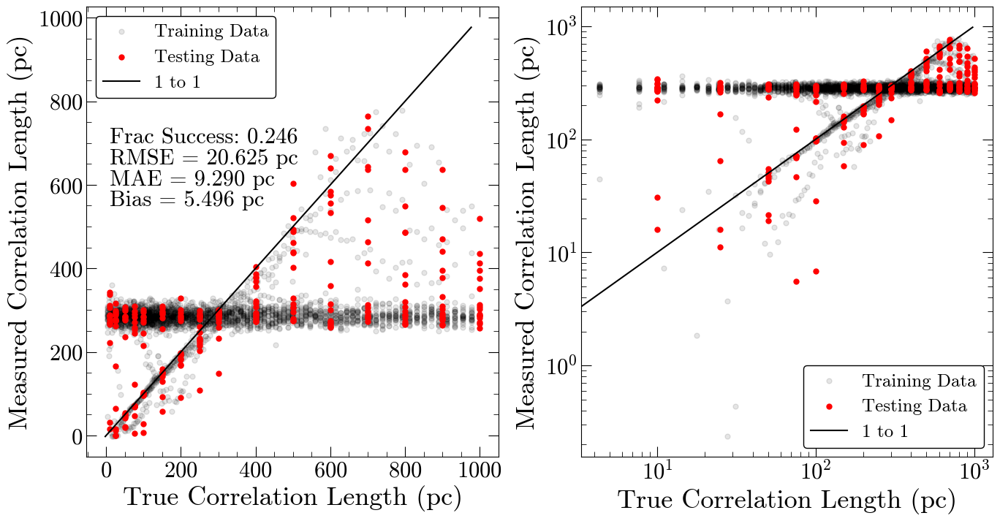

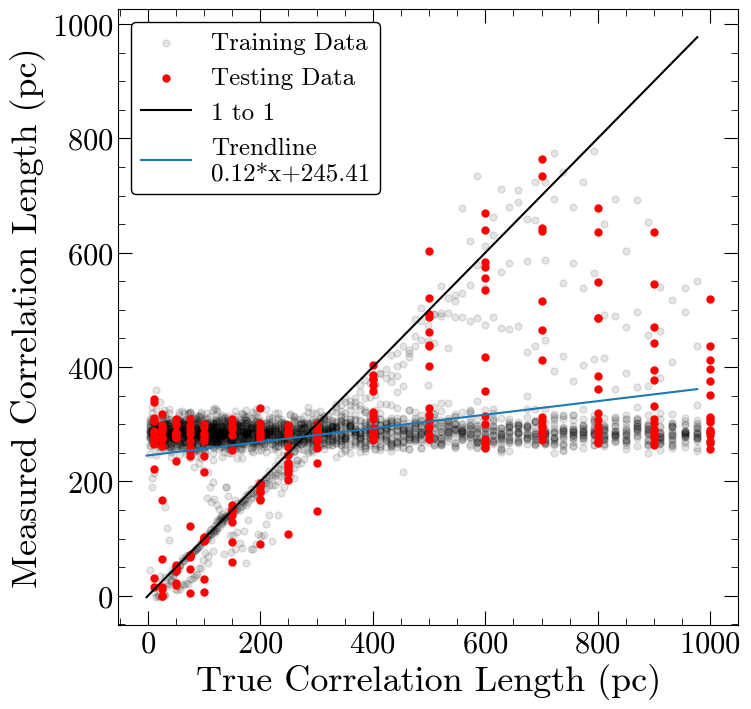

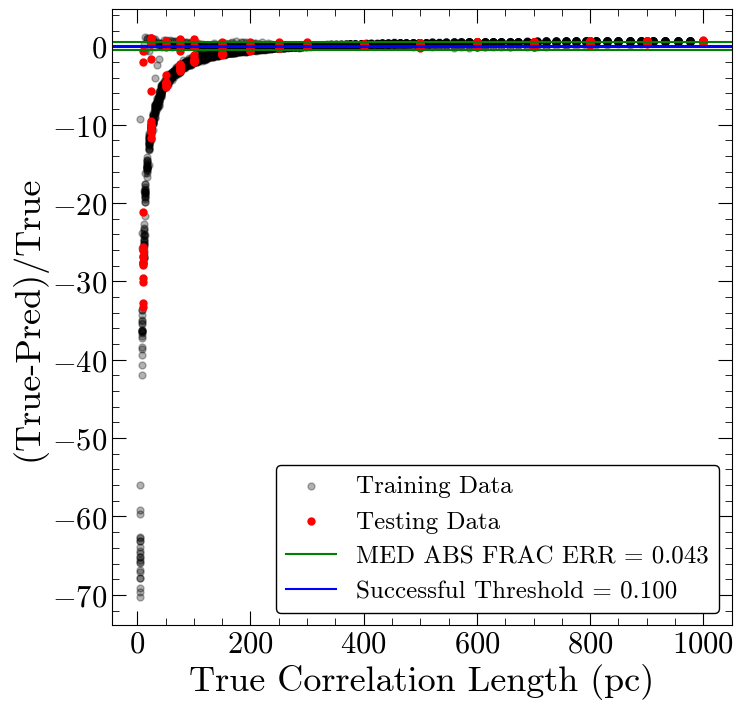

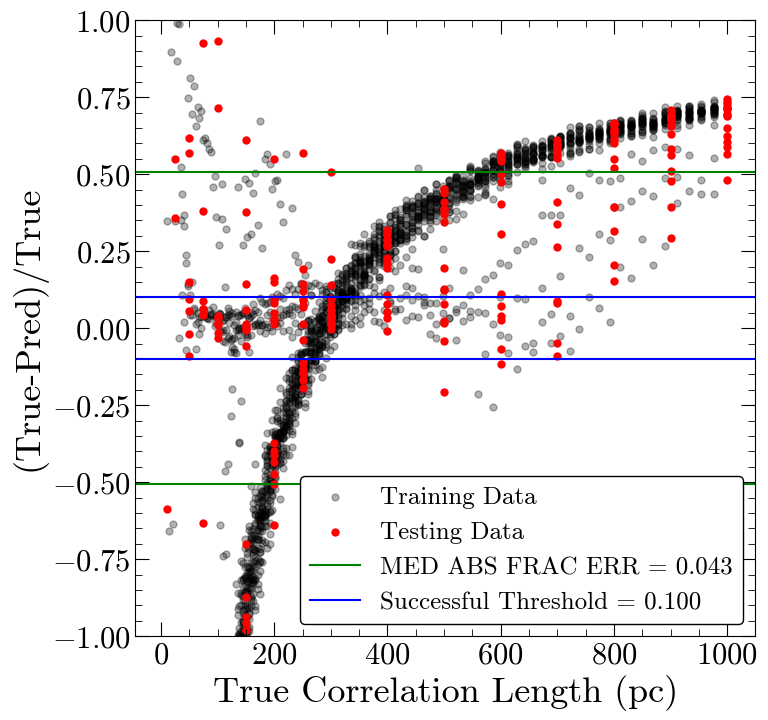

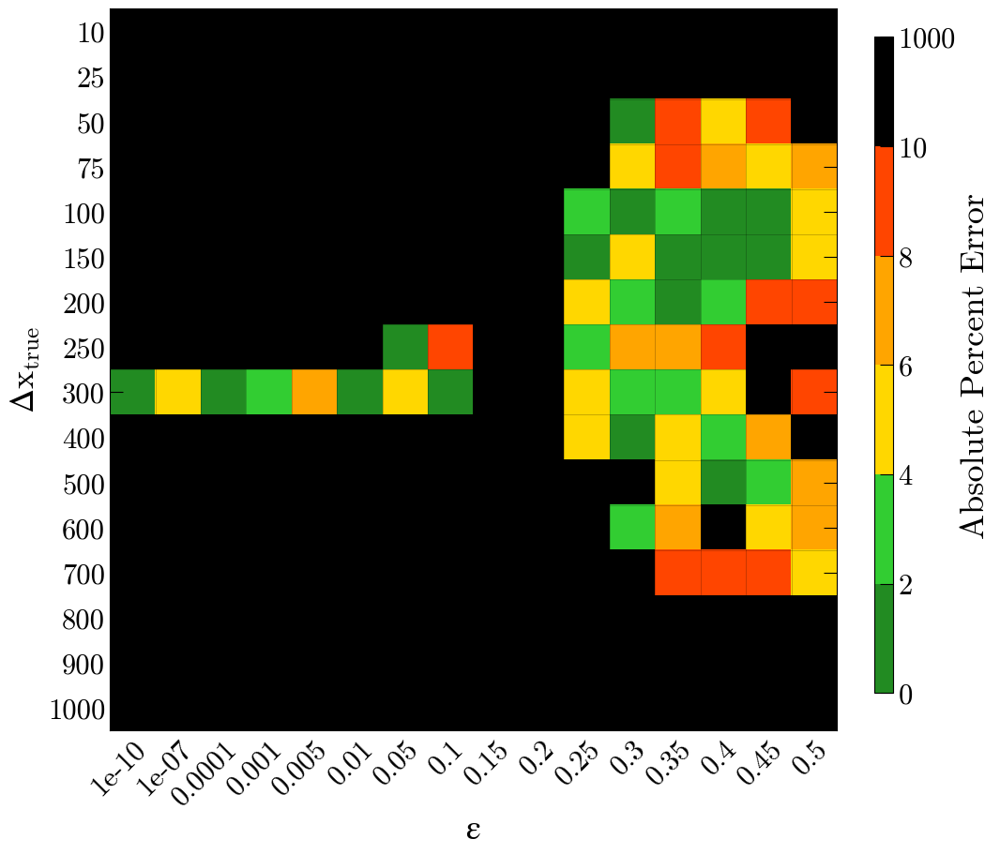

Number of squares with abs percent err>10%,  193


In [33]:
#simple model
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats for all models to compare and find best model
all_model_stats=output

Epoch 1/200
92/92 [==============================] - 1s 7ms/step - loss: 119675.4297
Epoch 2/200
92/92 [==============================] - 1s 6ms/step - loss: 65916.2734
Epoch 3/200
92/92 [==============================] - 1s 6ms/step - loss: 65527.2891
Epoch 4/200
92/92 [==============================] - 1s 9ms/step - loss: 65016.8125
Epoch 5/200
92/92 [==============================] - 1s 7ms/step - loss: 64566.2812
Epoch 6/200
92/92 [==============================] - 1s 7ms/step - loss: 64672.3164
Epoch 7/200
92/92 [==============================] - 1s 8ms/step - loss: 64229.6406
Epoch 8/200
92/92 [==============================] - 1s 7ms/step - loss: 63999.1992
Epoch 9/200
92/92 [==============================] - 1s 9ms/step - loss: 63808.8945
Epoch 10/200
92/92 [==============================] - 1s 7ms/step - loss: 63877.9922
Epoch 11/200
92/92 [==============================] - 1s 7ms/step - loss: 63700.4961
Epoch 12/200
92/92 [==============================] - 1s 8ms/step - loss:

92/92 [==============================] - 1s 10ms/step - loss: 60413.3438
Epoch 98/200
92/92 [==============================] - 1s 7ms/step - loss: 60656.7617
Epoch 99/200
92/92 [==============================] - 1s 8ms/step - loss: 60548.1641
Epoch 100/200
92/92 [==============================] - 1s 7ms/step - loss: 61177.6797
Epoch 101/200
92/92 [==============================] - 1s 7ms/step - loss: 60499.9531
Epoch 102/200
92/92 [==============================] - 1s 8ms/step - loss: 60506.4570
Epoch 103/200
92/92 [==============================] - 1s 8ms/step - loss: 60741.6641
Epoch 104/200
92/92 [==============================] - 1s 8ms/step - loss: 60497.1836
Epoch 105/200
92/92 [==============================] - 1s 7ms/step - loss: 60824.5742
Epoch 106/200
92/92 [==============================] - 1s 7ms/step - loss: 60590.3203
Epoch 107/200
92/92 [==============================] - 1s 8ms/step - loss: 60746.1016
Epoch 108/200
92/92 [==============================] - 1s 7ms/step - 

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 246.627 pc
MAE: 157.963 pc
BIAS: -6.941 pc
MED FRAC ERR: 0.555 

Training Stats, Successful Fits
Frac Success Fit: 0.149 
RMSE: 16.822 pc
MAE: 9.733 pc
BIAS: 3.069 pc
MED FRAC ERR: 0.039 

Testing Stats
RMSE: 282.309 pc
MAE: 128.983 pc
BIAS: 12.783 pc
MED FRAC ERR: 0.413 

Testing Stats, Successful Fits
Frac Success Fit: 0.250 
RMSE: 16.237 pc
MAE: 8.385 pc
BIAS: 6.608 pc
MED FRAC ERR: 0.035 


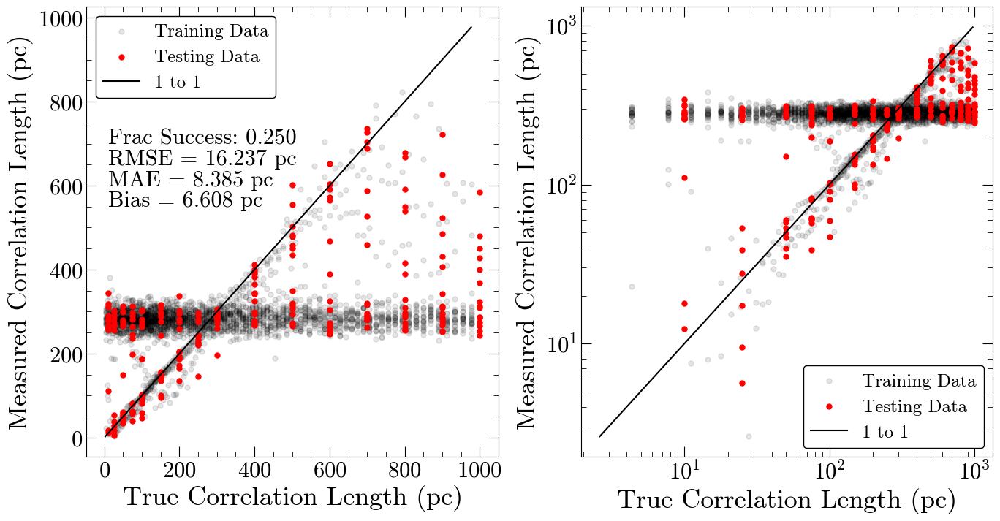

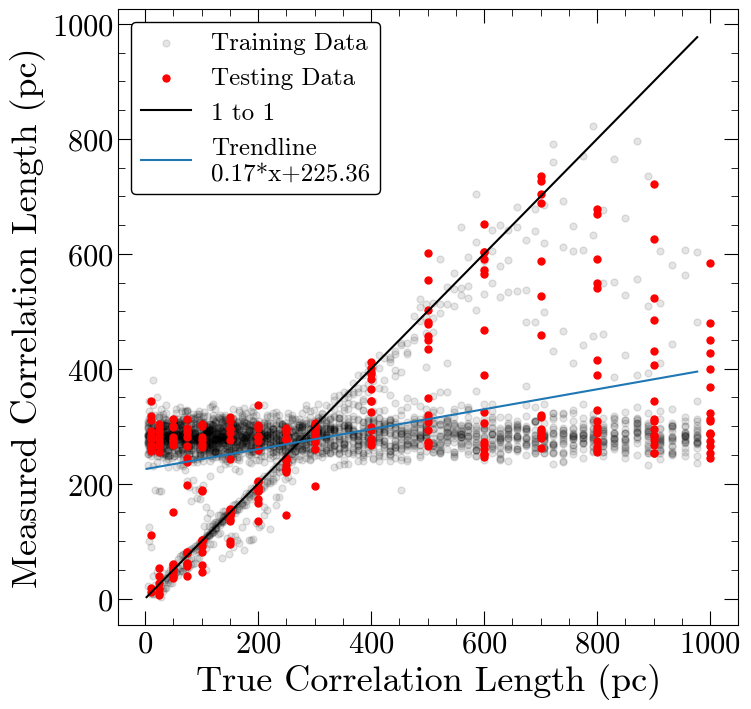

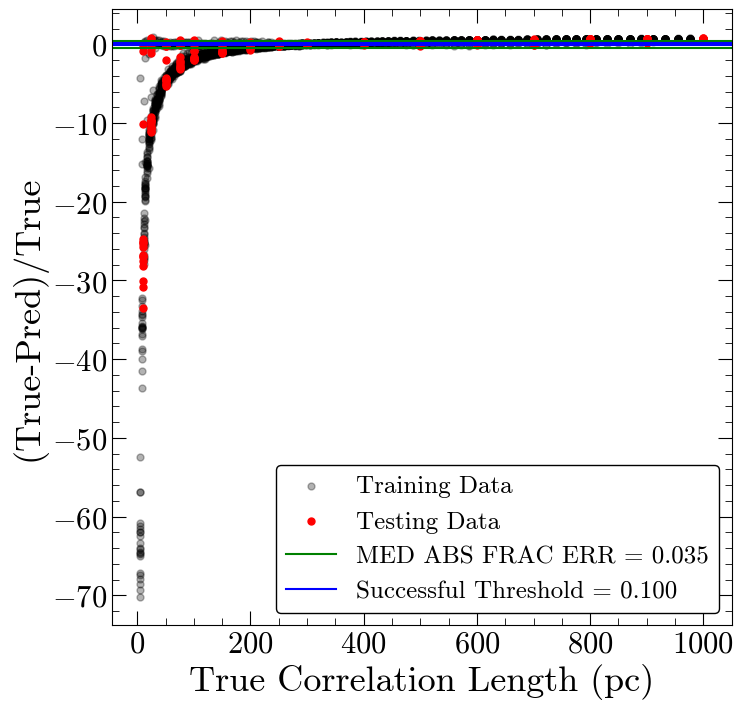

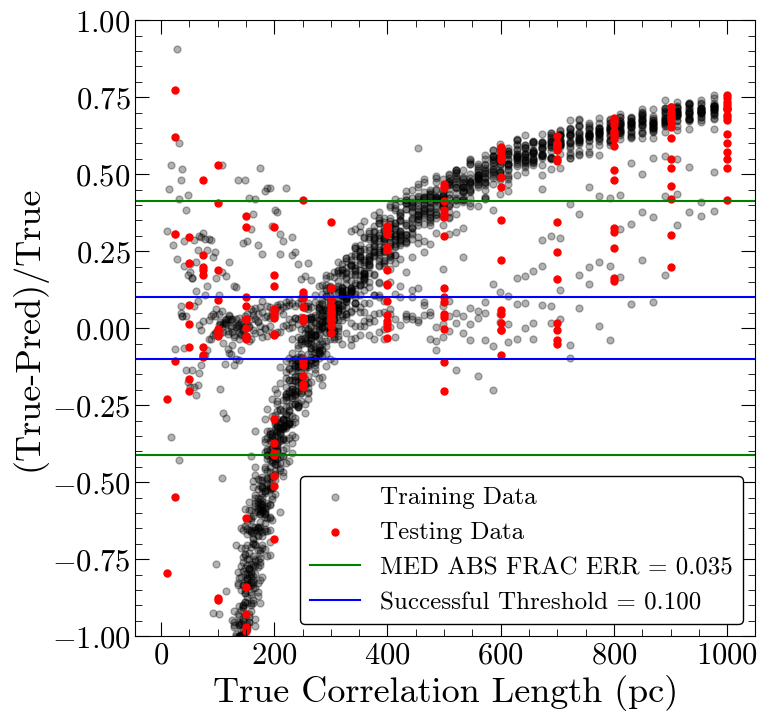

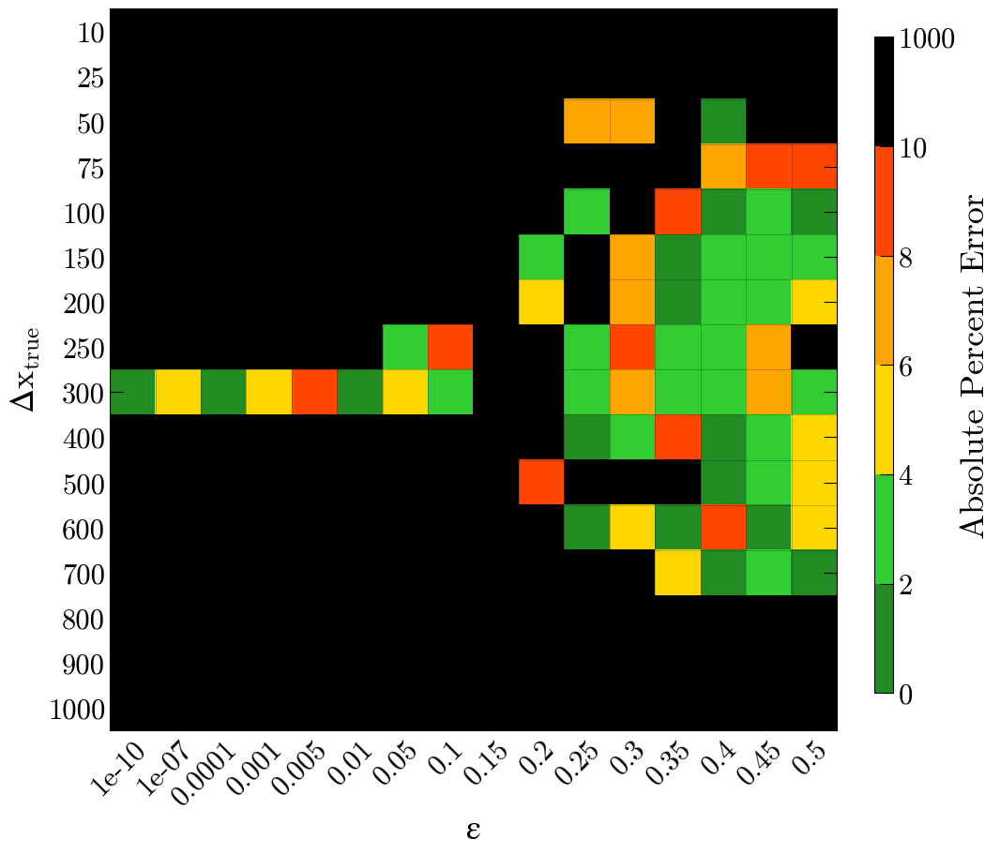

Number of squares with abs percent err>10%,  192


In [34]:
#simple model, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 11ms/step - loss: 103644.9766
Epoch 2/100
92/92 [==============================] - 1s 9ms/step - loss: 65443.7266
Epoch 3/100
92/92 [==============================] - 1s 10ms/step - loss: 64549.1328
Epoch 4/100
92/92 [==============================] - 1s 10ms/step - loss: 64905.0156
Epoch 5/100
92/92 [==============================] - 1s 10ms/step - loss: 63923.1484
Epoch 6/100
92/92 [==============================] - 1s 10ms/step - loss: 64408.6641
Epoch 7/100
92/92 [==============================] - 1s 10ms/step - loss: 63910.9297
Epoch 8/100
92/92 [==============================] - 1s 9ms/step - loss: 63804.2578
Epoch 9/100
92/92 [==============================] - 1s 9ms/step - loss: 63655.3008
Epoch 10/100
92/92 [==============================] - 1s 9ms/step - loss: 63564.5234
Epoch 11/100
92/92 [==============================] - 1s 10ms/step - loss: 63413.0820
Epoch 12/100
92/92 [==============================] - 1s 10ms/step

Epoch 97/100
92/92 [==============================] - 1s 8ms/step - loss: 59871.0898
Epoch 98/100
92/92 [==============================] - 1s 8ms/step - loss: 60065.2344
Epoch 99/100
92/92 [==============================] - 1s 9ms/step - loss: 59838.2578
Epoch 100/100
92/92 [==============================] - 1s 9ms/step - loss: 60494.5938

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 244.088 pc
MAE: 166.465 pc
BIAS: -19.180 pc
MED FRAC ERR: 0.549 

Training Stats, Successful Fits
Frac Success Fit: 0.157 
RMSE: 15.990 pc
MAE: 8.296 pc
BIAS: 0.254 pc
MED FRAC ERR: 0.036 

Testing Stats
RMSE: 273.188 pc
MAE: 115.860 pc
BIAS: 2.826 pc
MED FRAC ERR: 0.413 

Testing Stats, Successful Fits
Frac Success Fit: 0.297 
RMSE: 20.196 pc
MAE: 8.639 pc
BIAS: 0.496 pc
MED FRAC ERR: 0.032 


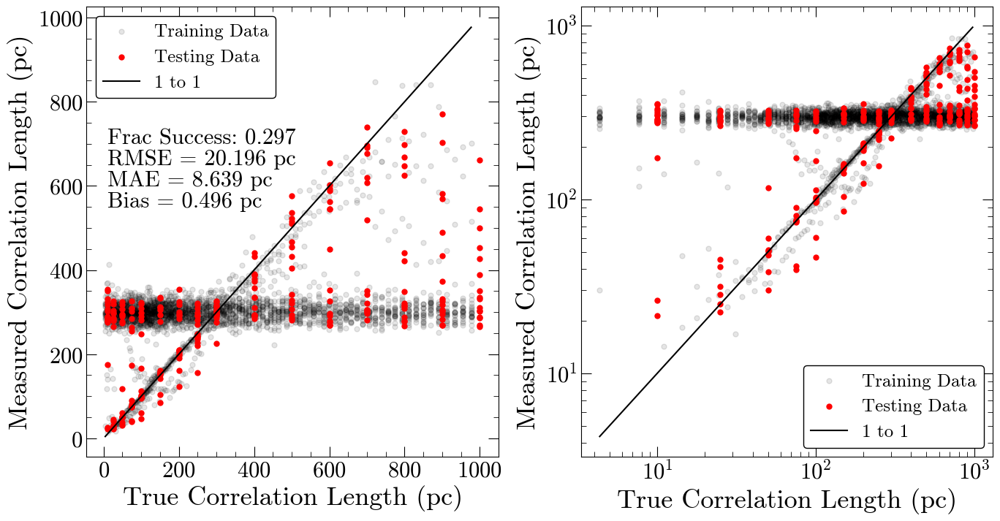

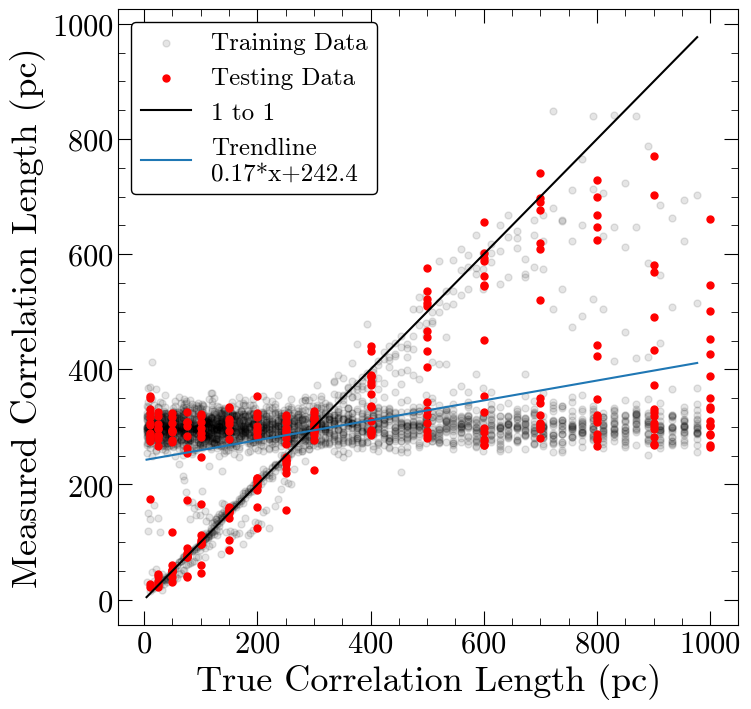

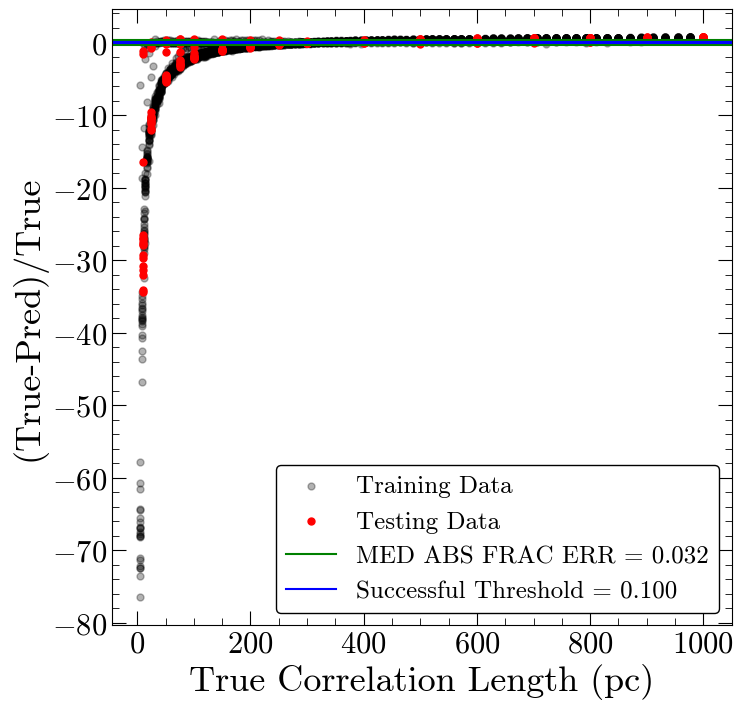

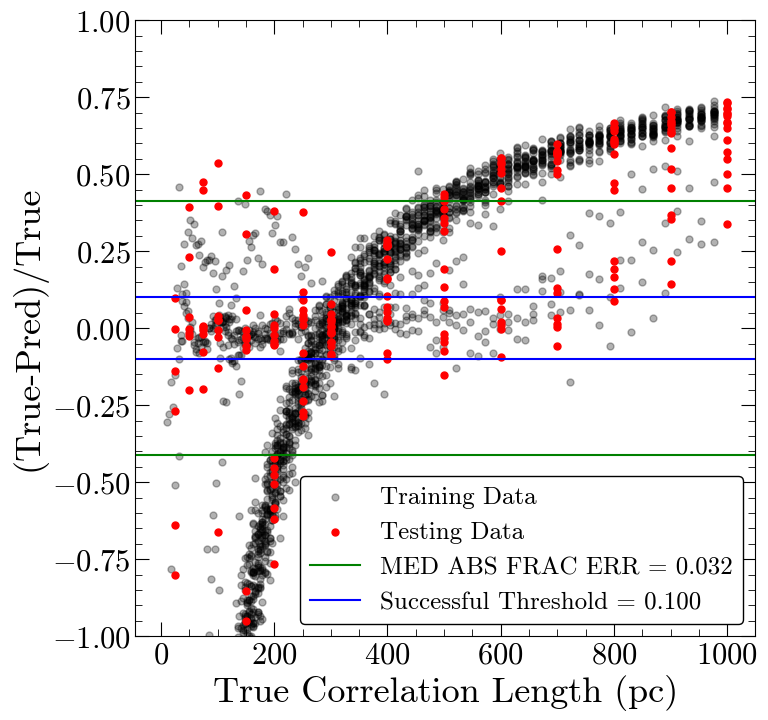

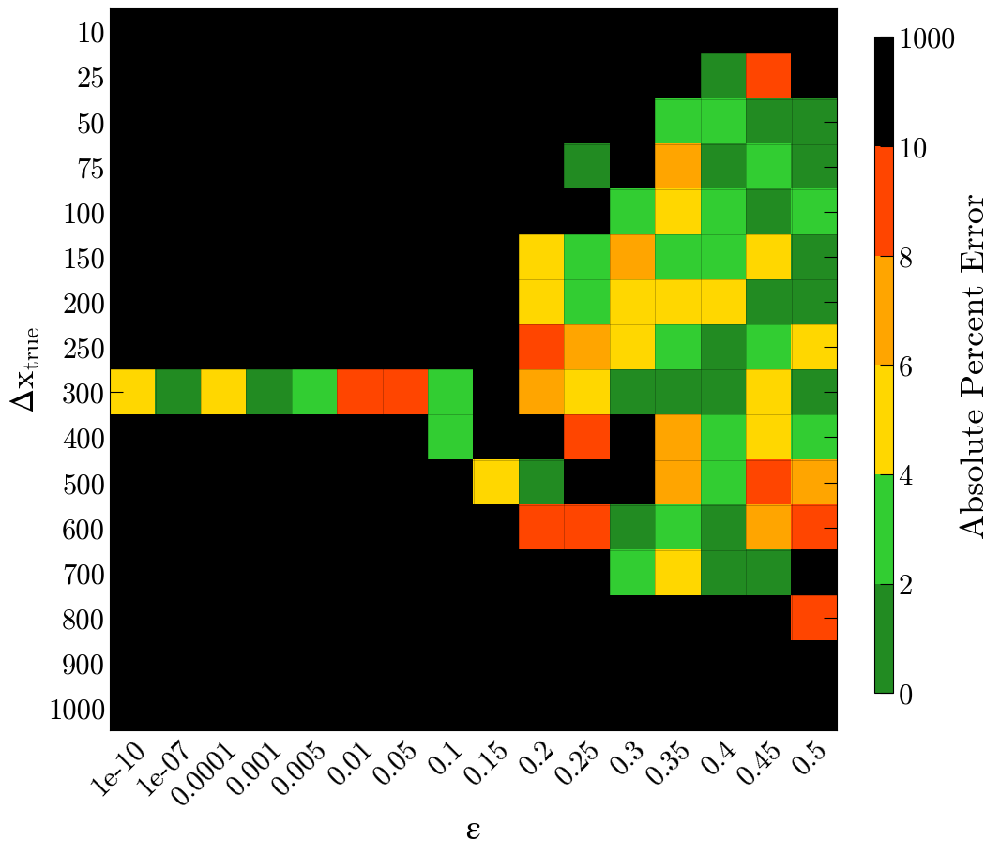

Number of squares with abs percent err>10%,  180


In [35]:
#model with more layers
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 1s 10ms/step - loss: 101669.5859
Epoch 2/200
92/92 [==============================] - 1s 10ms/step - loss: 65315.6250
Epoch 3/200
92/92 [==============================] - 1s 9ms/step - loss: 64758.8594
Epoch 4/200
92/92 [==============================] - 1s 9ms/step - loss: 64227.8008
Epoch 5/200
92/92 [==============================] - 1s 16ms/step - loss: 64156.6602
Epoch 6/200
92/92 [==============================] - 1s 11ms/step - loss: 63880.1562
Epoch 7/200
92/92 [==============================] - 1s 11ms/step - loss: 63996.4297
Epoch 8/200
92/92 [==============================] - 1s 12ms/step - loss: 63644.3125
Epoch 9/200
92/92 [==============================] - 1s 9ms/step - loss: 63552.6562
Epoch 10/200
92/92 [==============================] - 1s 9ms/step - loss: 63080.0977
Epoch 11/200
92/92 [==============================] - 1s 11ms/step - loss: 63756.3945
Epoch 12/200
92/92 [==============================] - 1s 11ms/step

92/92 [==============================] - 1s 7ms/step - loss: 59791.6289
Epoch 98/200
92/92 [==============================] - 1s 8ms/step - loss: 59578.3945
Epoch 99/200
92/92 [==============================] - 1s 6ms/step - loss: 59545.1211
Epoch 100/200
92/92 [==============================] - 1s 7ms/step - loss: 60083.4180
Epoch 101/200
92/92 [==============================] - 1s 7ms/step - loss: 59494.7812
Epoch 102/200
92/92 [==============================] - 1s 7ms/step - loss: 59509.2930
Epoch 103/200
92/92 [==============================] - 1s 8ms/step - loss: 59586.8555
Epoch 104/200
92/92 [==============================] - 1s 8ms/step - loss: 59800.9297
Epoch 105/200
92/92 [==============================] - 1s 8ms/step - loss: 59812.9609
Epoch 106/200
92/92 [==============================] - 1s 8ms/step - loss: 60258.2500
Epoch 107/200
92/92 [==============================] - 1s 8ms/step - loss: 59591.7070
Epoch 108/200
92/92 [==============================] - 1s 8ms/step - l

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 245.704 pc
MAE: 195.619 pc
BIAS: -72.510 pc
MED FRAC ERR: 0.546 

Training Stats, Successful Fits
Frac Success Fit: 0.167 
RMSE: 21.454 pc
MAE: 13.136 pc
BIAS: -4.966 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 252.707 pc
MAE: 113.005 pc
BIAS: -11.311 pc
MED FRAC ERR: 0.305 

Testing Stats, Successful Fits
Frac Success Fit: 0.262 
RMSE: 20.301 pc
MAE: 10.623 pc
BIAS: -8.366 pc
MED FRAC ERR: 0.046 


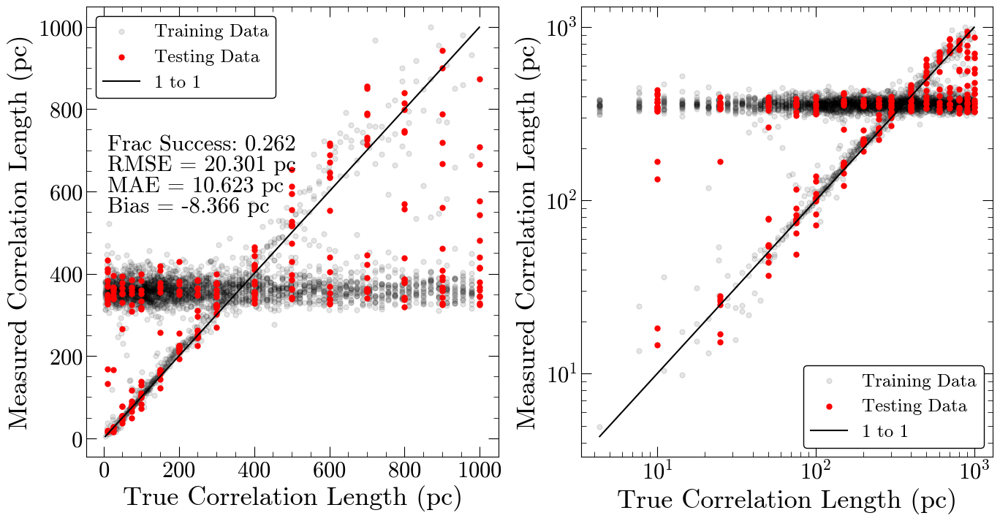

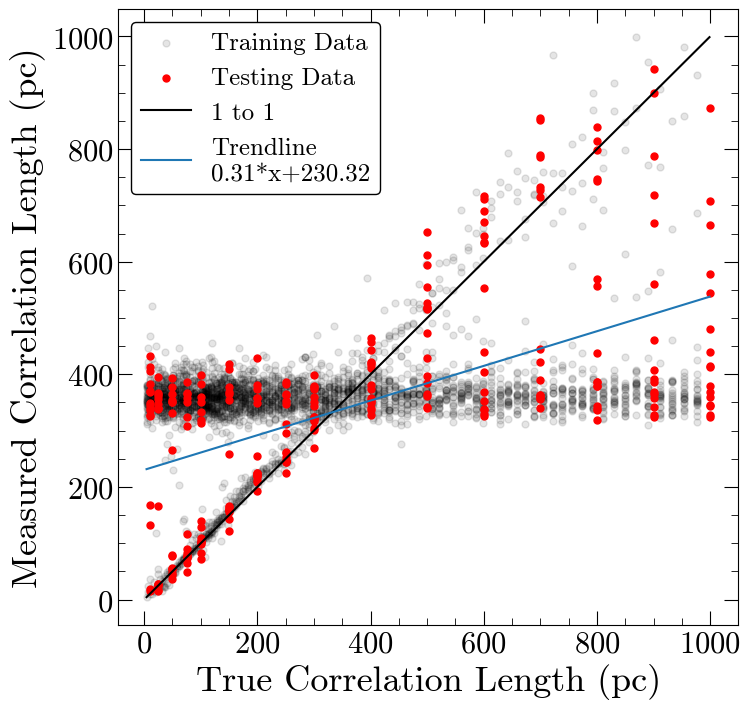

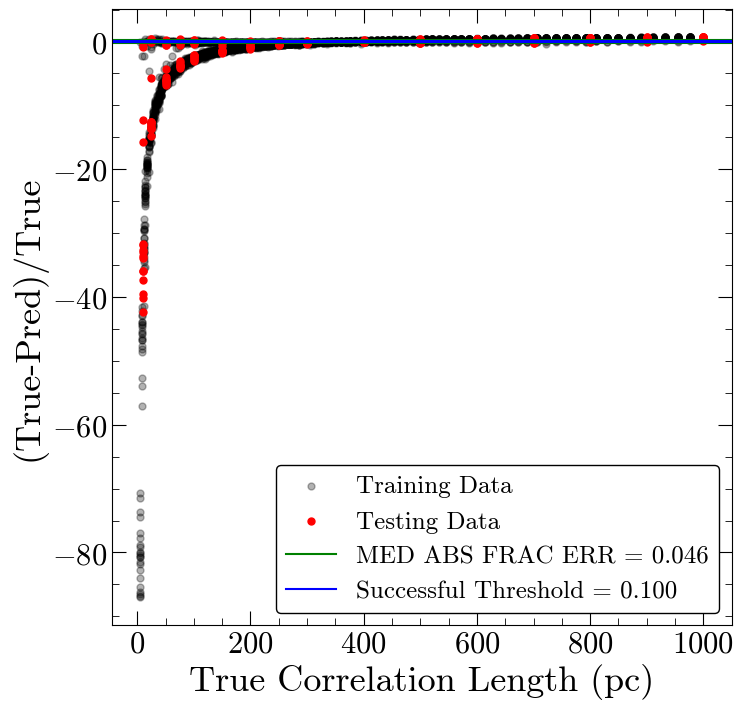

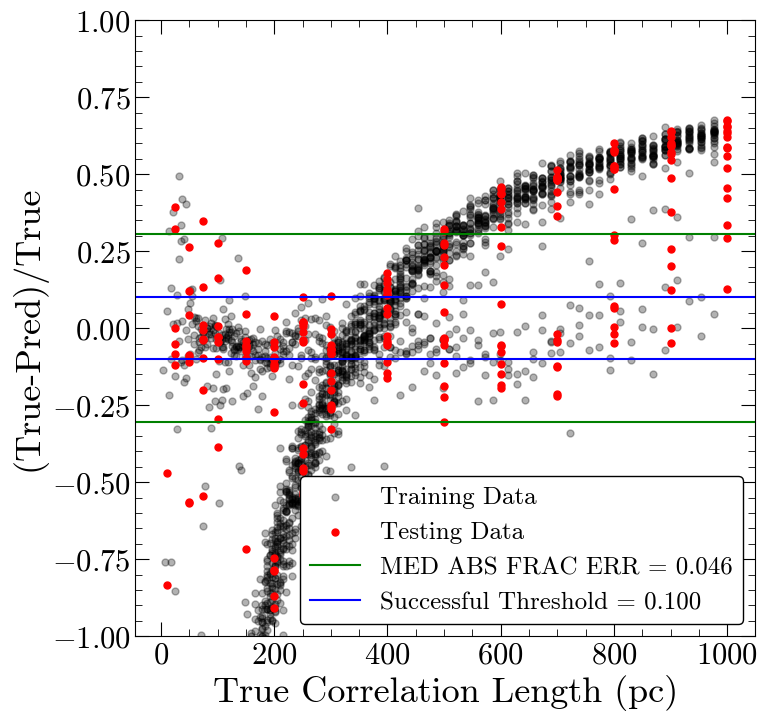

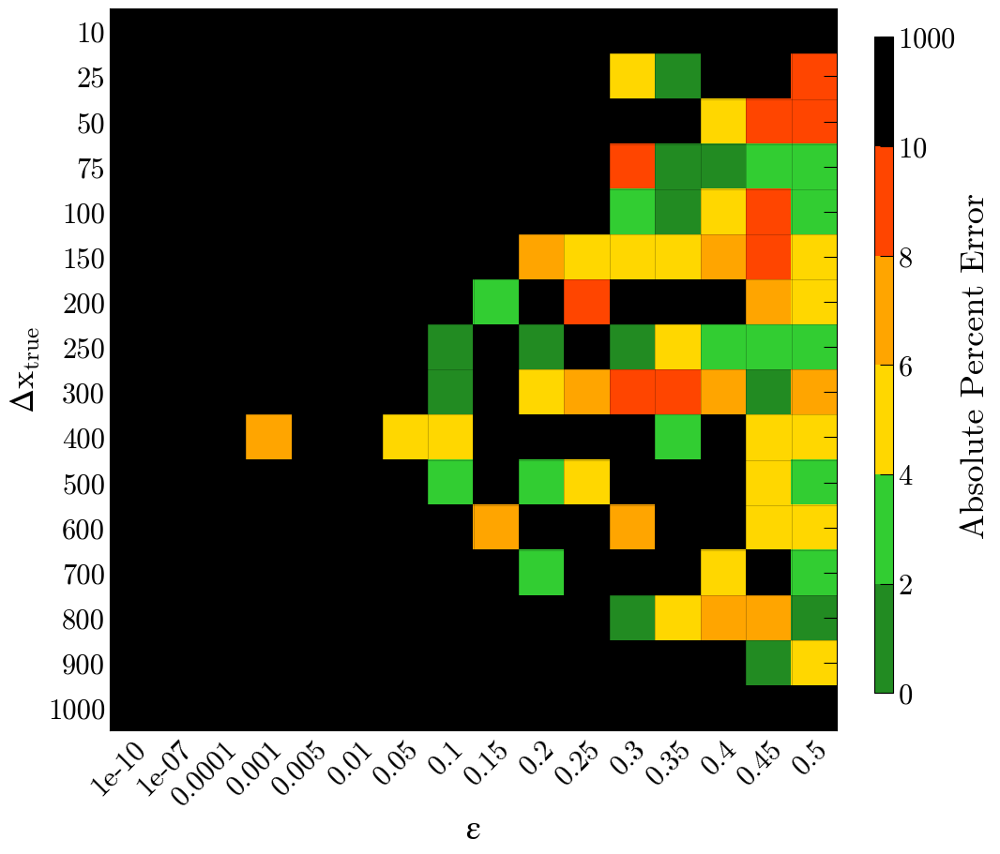

Number of squares with abs percent err>10%,  189


In [36]:
#model with more layers, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 9ms/step - loss: 101917.4609
Epoch 2/100
92/92 [==============================] - 1s 7ms/step - loss: 65715.2344
Epoch 3/100
92/92 [==============================] - 1s 7ms/step - loss: 64916.9844
Epoch 4/100
92/92 [==============================] - 1s 7ms/step - loss: 64728.8555
Epoch 5/100
92/92 [==============================] - 1s 7ms/step - loss: 64829.3984
Epoch 6/100
92/92 [==============================] - 1s 7ms/step - loss: 64369.1445
Epoch 7/100
92/92 [==============================] - 1s 6ms/step - loss: 64023.5664
Epoch 8/100
92/92 [==============================] - 1s 8ms/step - loss: 64419.5703
Epoch 9/100
92/92 [==============================] - 1s 9ms/step - loss: 63860.5664
Epoch 10/100
92/92 [==============================] - 1s 7ms/step - loss: 63394.1797
Epoch 11/100
92/92 [==============================] - 1s 7ms/step - loss: 63324.1641
Epoch 12/100
92/92 [==============================] - 1s 8ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 245.530 pc
MAE: 159.981 pc
BIAS: -8.401 pc
MED FRAC ERR: 0.555 

Training Stats, Successful Fits
Frac Success Fit: 0.125 
RMSE: 19.447 pc
MAE: 12.902 pc
BIAS: 8.110 pc
MED FRAC ERR: 0.058 

Testing Stats
RMSE: 277.736 pc
MAE: 120.458 pc
BIAS: 15.727 pc
MED FRAC ERR: 0.425 

Testing Stats, Successful Fits
Frac Success Fit: 0.207 
RMSE: 24.426 pc
MAE: 10.210 pc
BIAS: 7.624 pc
MED FRAC ERR: 0.048 


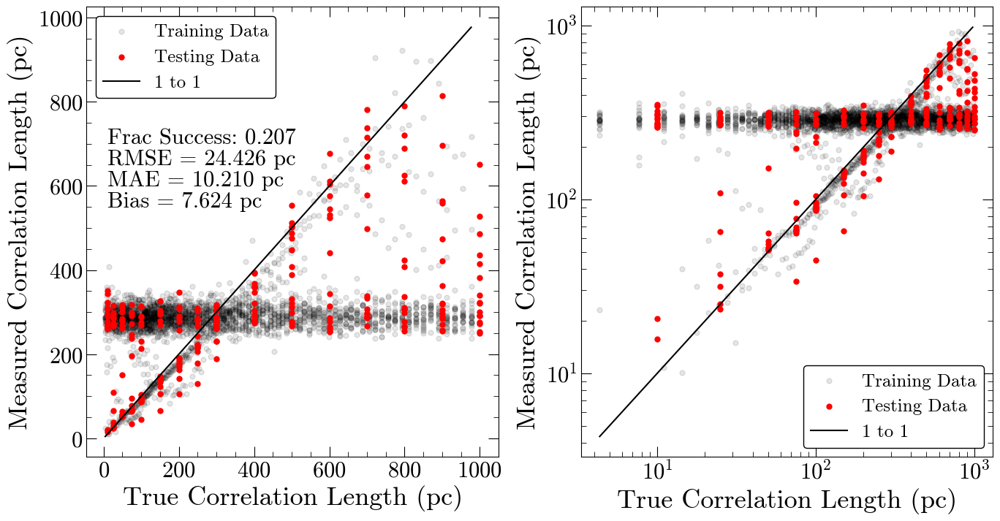

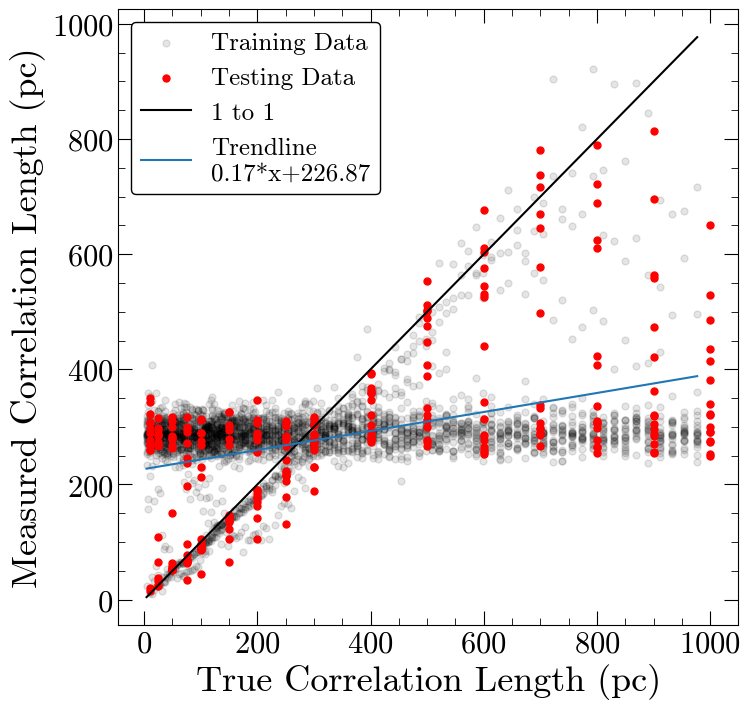

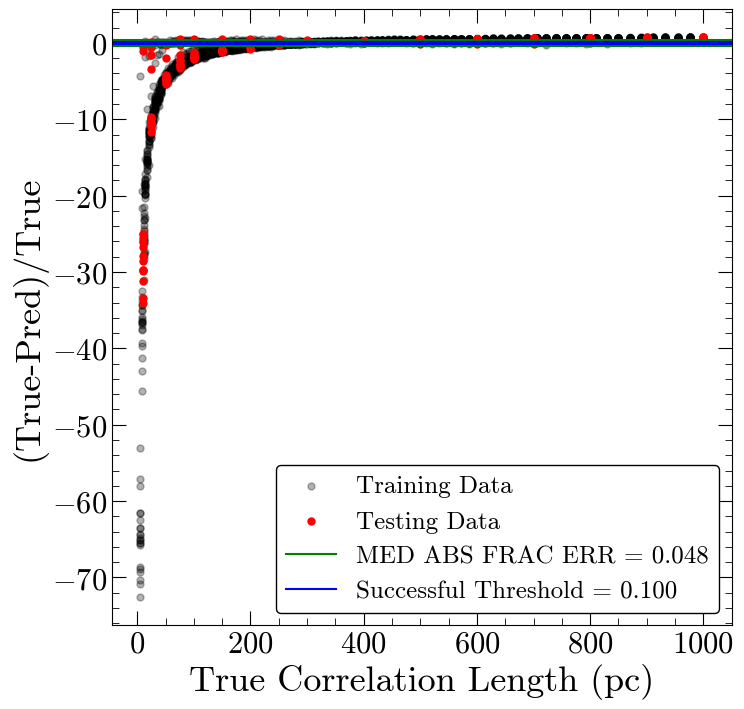

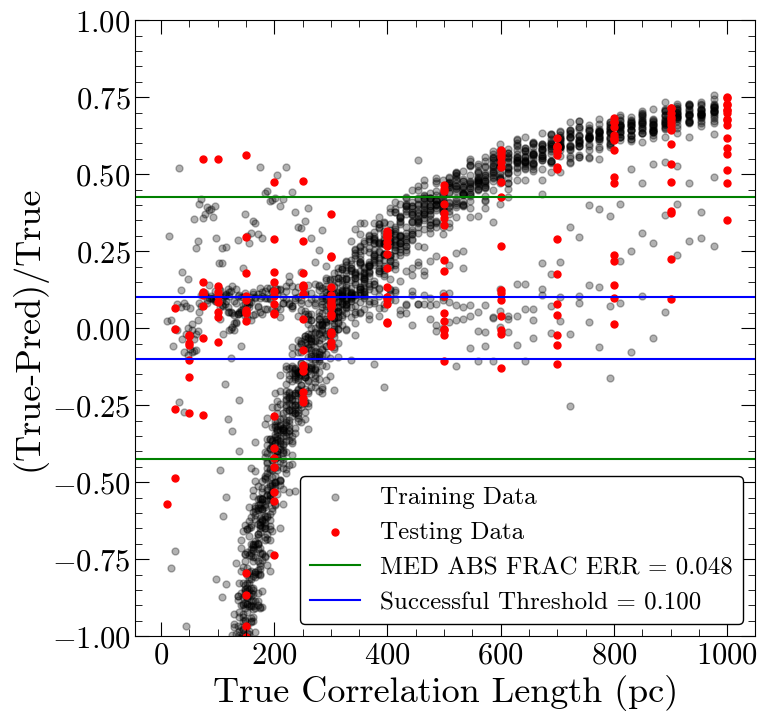

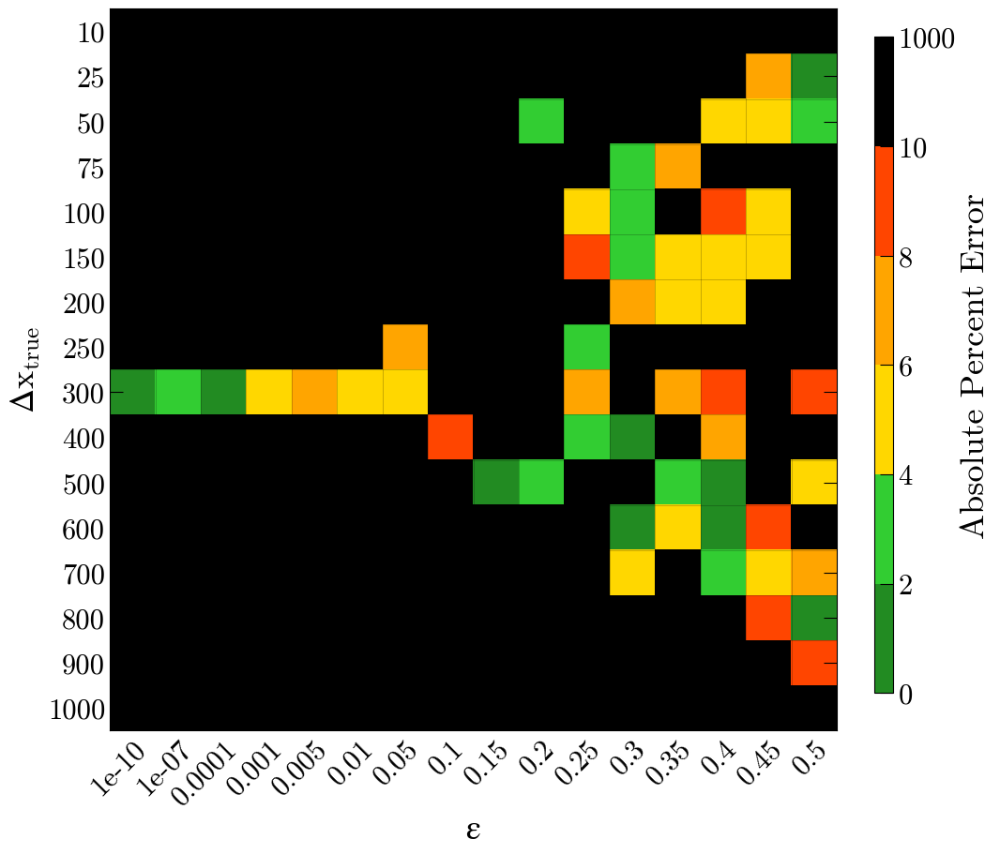

Number of squares with abs percent err>10%,  203


In [37]:
#model with more layers, increase max pooling in first layer
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 7ms/step - loss: 103351.3438
Epoch 2/100
92/92 [==============================] - 1s 7ms/step - loss: 65238.8906
Epoch 3/100
92/92 [==============================] - 1s 6ms/step - loss: 64722.2852
Epoch 4/100
92/92 [==============================] - 1s 7ms/step - loss: 64306.1562
Epoch 5/100
92/92 [==============================] - 1s 7ms/step - loss: 64538.8086
Epoch 6/100
92/92 [==============================] - 1s 7ms/step - loss: 64338.1641
Epoch 7/100
92/92 [==============================] - 1s 7ms/step - loss: 63953.4570
Epoch 8/100
92/92 [==============================] - 1s 7ms/step - loss: 64040.0352
Epoch 9/100
92/92 [==============================] - 1s 7ms/step - loss: 63375.7266
Epoch 10/100
92/92 [==============================] - 1s 7ms/step - loss: 63071.7188
Epoch 11/100
92/92 [==============================] - 1s 7ms/step - loss: 63615.4414
Epoch 12/100
92/92 [==============================] - 1s 7ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 243.947 pc
MAE: 178.524 pc
BIAS: -42.624 pc
MED FRAC ERR: 0.555 

Training Stats, Successful Fits
Frac Success Fit: 0.149 
RMSE: 18.024 pc
MAE: 9.505 pc
BIAS: 2.772 pc
MED FRAC ERR: 0.040 

Testing Stats
RMSE: 266.453 pc
MAE: 120.372 pc
BIAS: 7.767 pc
MED FRAC ERR: 0.395 

Testing Stats, Successful Fits
Frac Success Fit: 0.242 
RMSE: 21.395 pc
MAE: 12.148 pc
BIAS: 4.639 pc
MED FRAC ERR: 0.039 


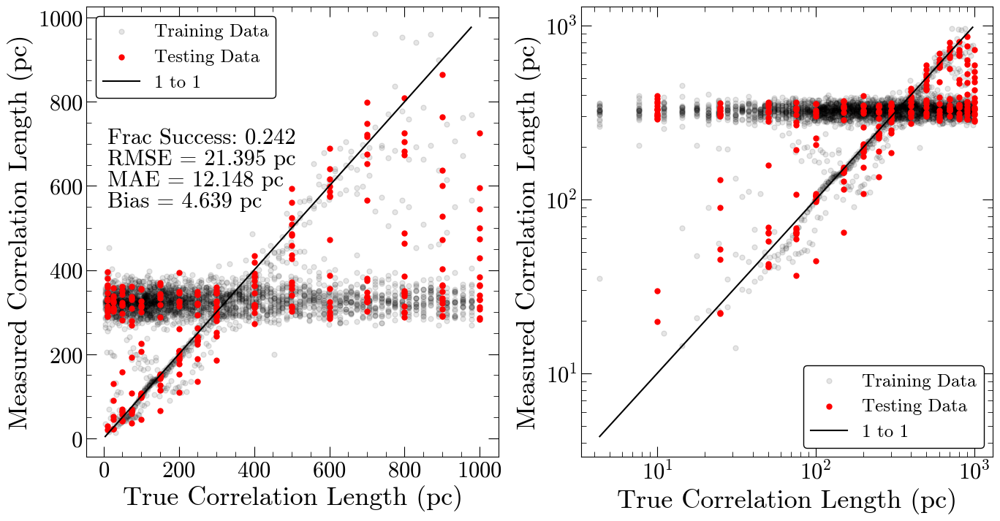

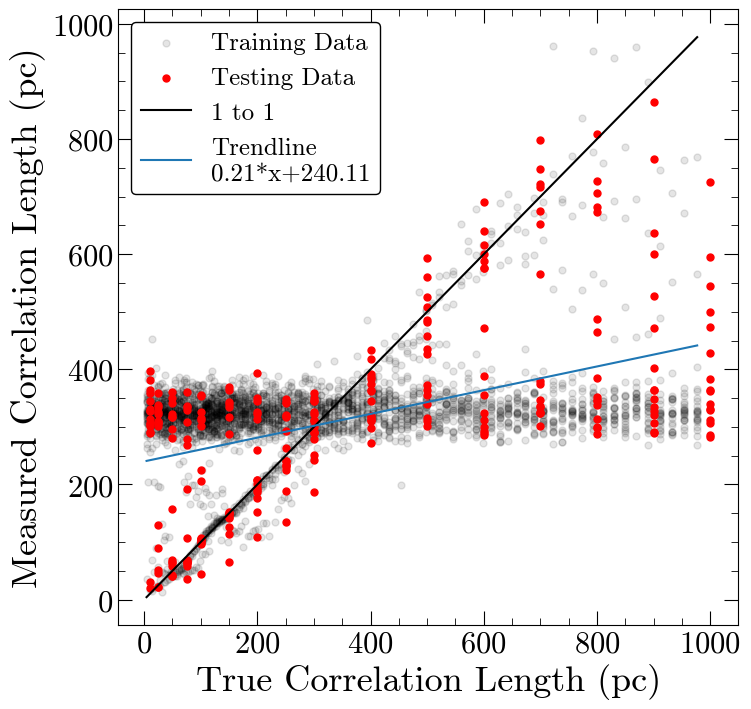

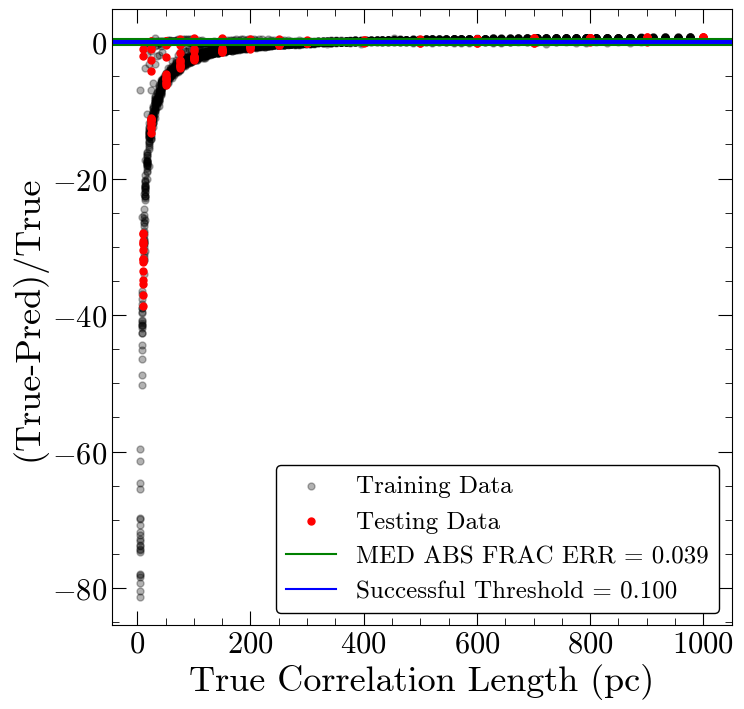

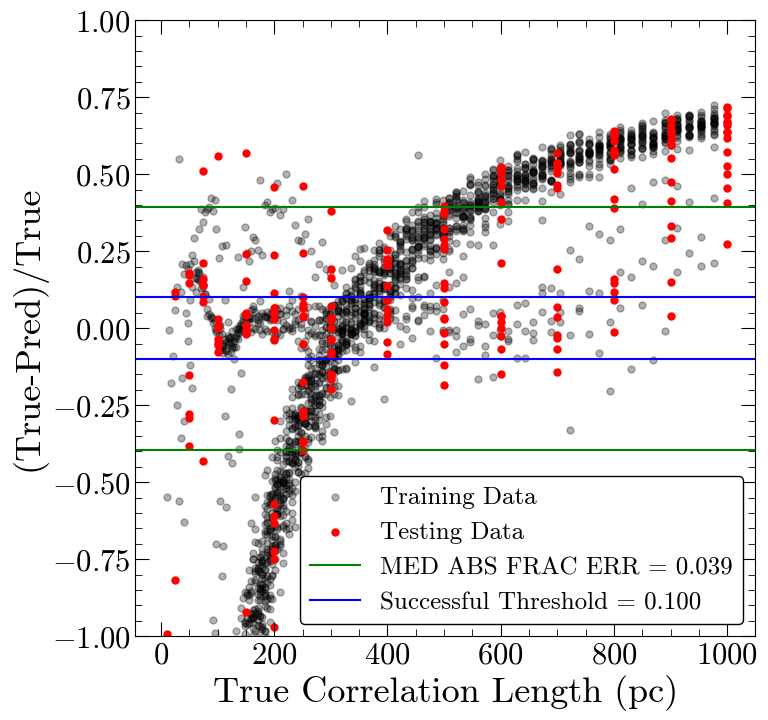

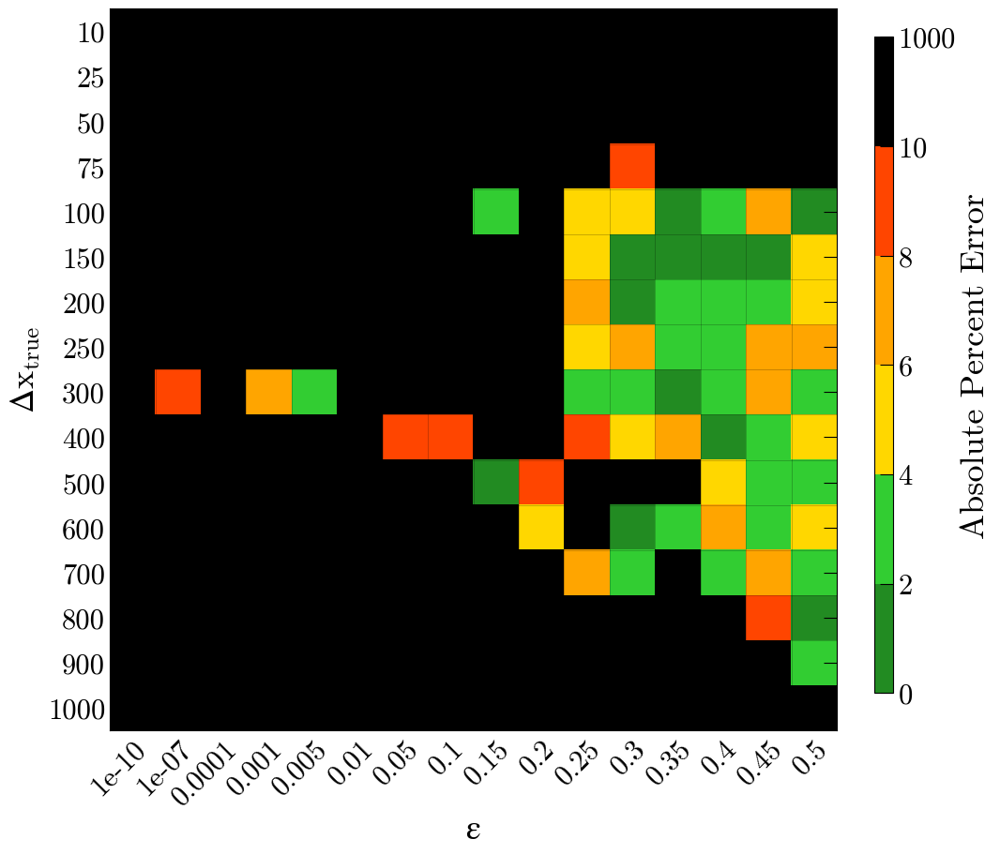

Number of squares with abs percent err>10%,  194


In [38]:
#model with more layers, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 2s 9ms/step - loss: 103603.9375
Epoch 2/200
92/92 [==============================] - 1s 9ms/step - loss: 64914.2891
Epoch 3/200
92/92 [==============================] - 1s 9ms/step - loss: 64582.6836
Epoch 4/200
92/92 [==============================] - 1s 9ms/step - loss: 64996.5859
Epoch 5/200
92/92 [==============================] - 1s 9ms/step - loss: 64604.1602
Epoch 6/200
92/92 [==============================] - 1s 9ms/step - loss: 64642.8203
Epoch 7/200
92/92 [==============================] - 1s 8ms/step - loss: 64564.7383
Epoch 8/200
92/92 [==============================] - 1s 10ms/step - loss: 64203.6055
Epoch 9/200
92/92 [==============================] - 1s 9ms/step - loss: 64305.5664
Epoch 10/200
92/92 [==============================] - 1s 9ms/step - loss: 64105.3711
Epoch 11/200
92/92 [==============================] - 1s 10ms/step - loss: 63630.1367
Epoch 12/200
92/92 [==============================] - 1s 9ms/step - los

92/92 [==============================] - 1s 10ms/step - loss: 58947.3750
Epoch 193/200
92/92 [==============================] - 1s 9ms/step - loss: 58915.0273
Epoch 194/200
92/92 [==============================] - 1s 9ms/step - loss: 58850.1016
Epoch 195/200
92/92 [==============================] - 1s 9ms/step - loss: 59363.8945
Epoch 196/200
92/92 [==============================] - 1s 10ms/step - loss: 58912.7070
Epoch 197/200
92/92 [==============================] - 1s 10ms/step - loss: 58939.9805
Epoch 198/200
92/92 [==============================] - 1s 9ms/step - loss: 59029.1758
Epoch 199/200
92/92 [==============================] - 1s 9ms/step - loss: 58972.4570
Epoch 200/200
92/92 [==============================] - 1s 9ms/step - loss: 58990.0117

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 242.039 pc
MAE: 173.097 pc
BIAS: -37.799 pc
MED FRAC ERR: 0.546 

Training Stats, Successful Fits
Frac Success Fit: 0.163 
RMSE: 18.720 pc
MAE: 8.610 pc
BIAS: 0.979 pc
MED FRAC ERR: 0.034 

Testing Stats
RMSE: 259.460 pc
MAE: 103.698 pc
BIAS: 2.774 pc
MED FRAC ERR: 0.345 

Testing Stats, Successful Fits
Frac Success Fit: 0.289 
RMSE: 18.692 pc
MAE: 8.118 pc
BIAS: 3.511 pc
MED FRAC ERR: 0.034 


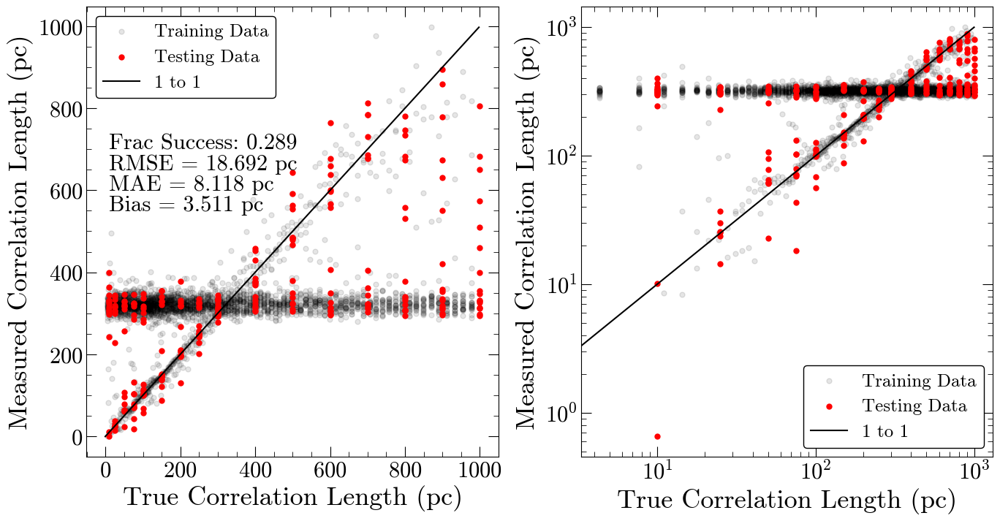

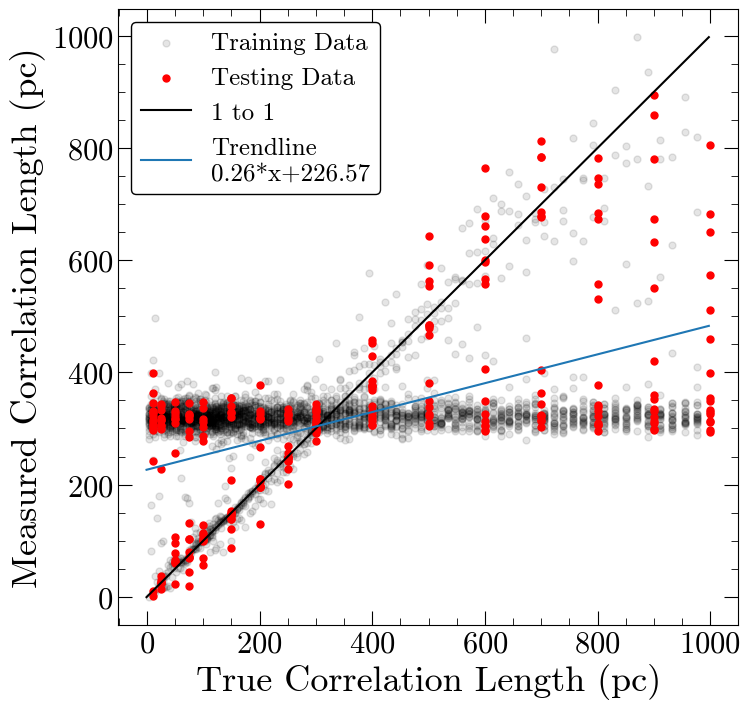

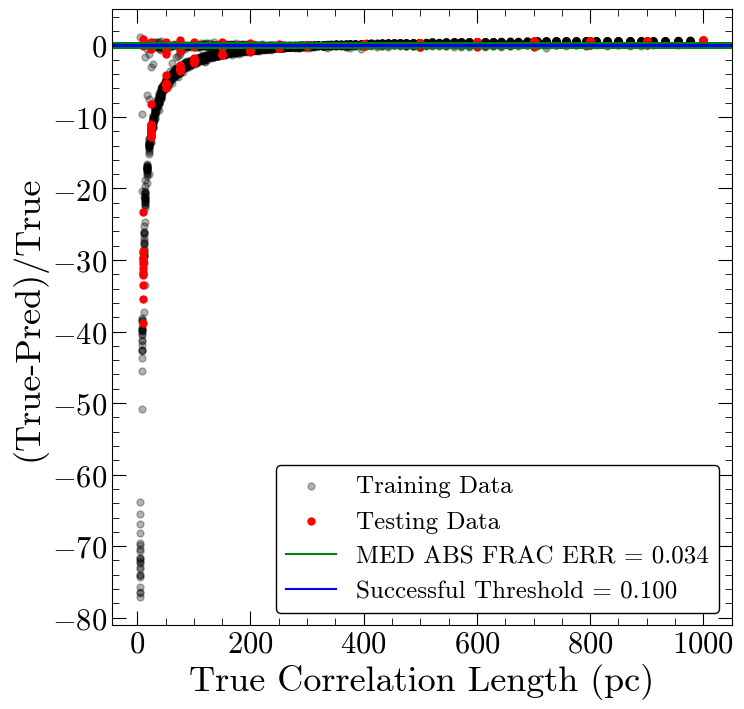

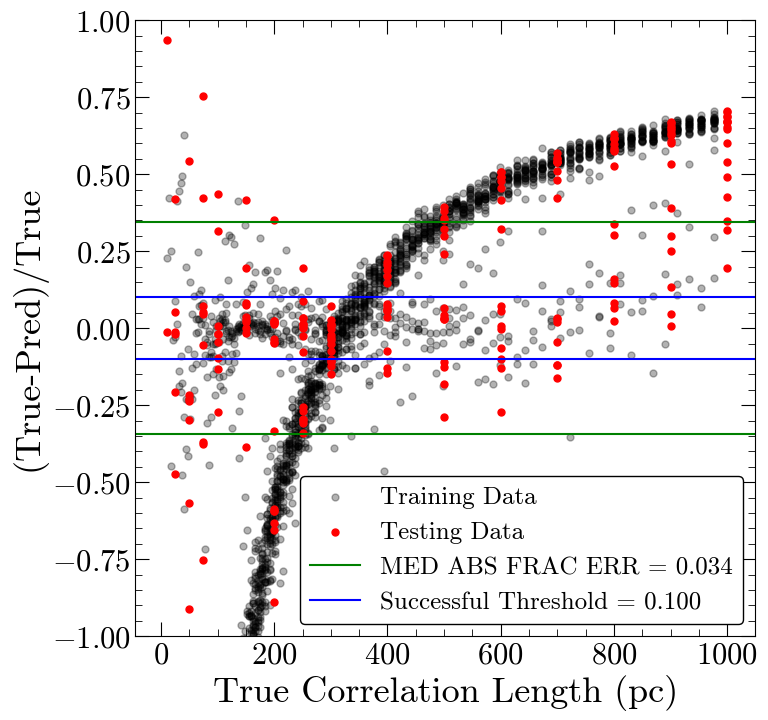

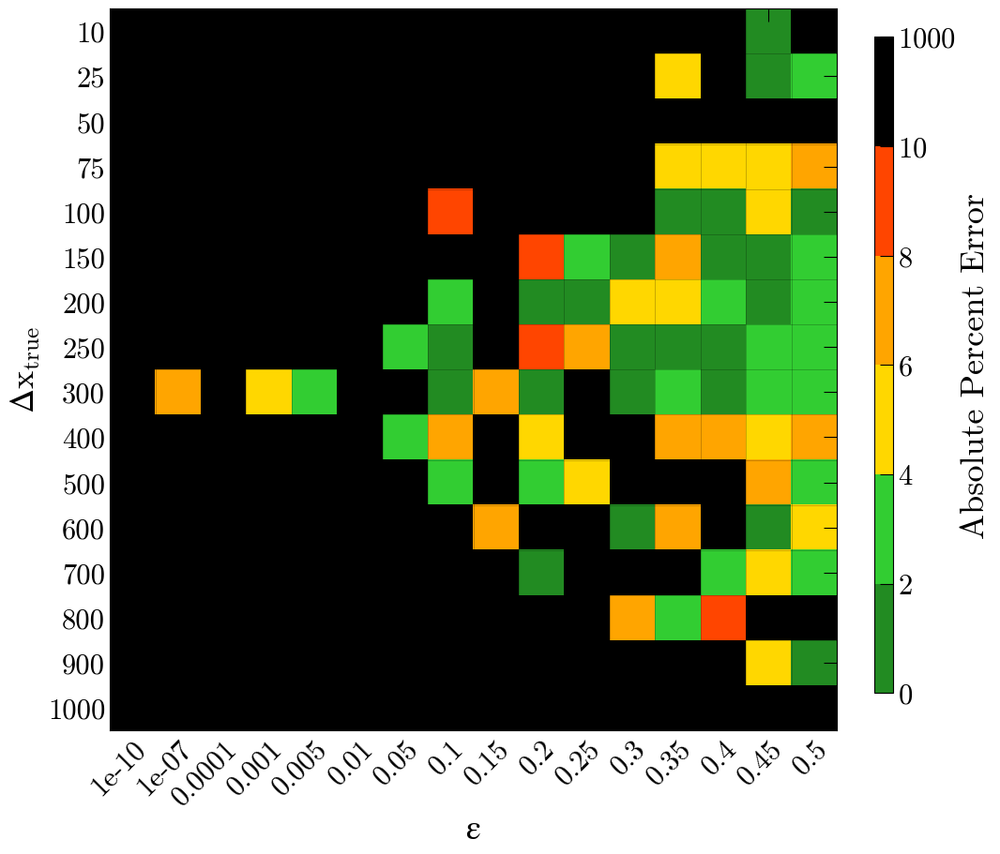

Number of squares with abs percent err>10%,  182


In [39]:
#model with more layers, run for more epochs, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 2s 11ms/step - loss: 97882.3438
Epoch 2/400
92/92 [==============================] - 1s 9ms/step - loss: 65167.9961
Epoch 3/400
92/92 [==============================] - 1s 11ms/step - loss: 64366.5391
Epoch 4/400
92/92 [==============================] - 1s 10ms/step - loss: 64136.4023
Epoch 5/400
92/92 [==============================] - 1s 10ms/step - loss: 63981.0625
Epoch 6/400
92/92 [==============================] - 1s 11ms/step - loss: 63888.3789
Epoch 7/400
92/92 [==============================] - 1s 12ms/step - loss: 63650.9023
Epoch 8/400
92/92 [==============================] - 1s 10ms/step - loss: 64278.7383
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 63509.6914
Epoch 10/400
92/92 [==============================] - 1s 10ms/step - loss: 63706.7305
Epoch 11/400
92/92 [==============================] - 1s 10ms/step - loss: 63147.1523
Epoch 12/400
92/92 [==============================] - 1s 10ms/st

92/92 [==============================] - 1s 10ms/step - loss: 59001.0156
Epoch 192/400
92/92 [==============================] - 1s 11ms/step - loss: 59257.7539
Epoch 193/400
92/92 [==============================] - 1s 10ms/step - loss: 59601.4688
Epoch 194/400
92/92 [==============================] - 1s 9ms/step - loss: 59469.4766
Epoch 195/400
92/92 [==============================] - 1s 9ms/step - loss: 59030.6328
Epoch 196/400
92/92 [==============================] - 1s 10ms/step - loss: 59699.2969
Epoch 197/400
92/92 [==============================] - 1s 9ms/step - loss: 59127.0898
Epoch 198/400
92/92 [==============================] - 1s 10ms/step - loss: 59363.1328
Epoch 199/400
92/92 [==============================] - 1s 9ms/step - loss: 59287.5586
Epoch 200/400
92/92 [==============================] - 1s 9ms/step - loss: 59311.4727
Epoch 201/400
92/92 [==============================] - 1s 8ms/step - loss: 59632.8711
Epoch 202/400
92/92 [==============================] - 1s 12ms/

92/92 [==============================] - 1s 11ms/step - loss: 58211.1055
Epoch 380/400
92/92 [==============================] - 1s 12ms/step - loss: 58441.2461
Epoch 381/400
92/92 [==============================] - 1s 10ms/step - loss: 58436.7812
Epoch 382/400
92/92 [==============================] - 1s 10ms/step - loss: 58393.4102
Epoch 383/400
92/92 [==============================] - 1s 11ms/step - loss: 58606.9688
Epoch 384/400
92/92 [==============================] - 1s 9ms/step - loss: 58322.6133
Epoch 385/400
92/92 [==============================] - 1s 9ms/step - loss: 58256.3164
Epoch 386/400
92/92 [==============================] - 1s 10ms/step - loss: 58957.9062
Epoch 387/400
92/92 [==============================] - 1s 10ms/step - loss: 58696.8477
Epoch 388/400
92/92 [==============================] - 1s 10ms/step - loss: 58452.5664
Epoch 389/400
92/92 [==============================] - 1s 10ms/step - loss: 58270.9648
Epoch 390/400
92/92 [==============================] - 1s 9

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 240.744 pc
MAE: 171.504 pc
BIAS: -22.451 pc
MED FRAC ERR: 0.537 

Training Stats, Successful Fits
Frac Success Fit: 0.183 
RMSE: 18.033 pc
MAE: 7.977 pc
BIAS: 0.021 pc
MED FRAC ERR: 0.036 

Testing Stats
RMSE: 256.568 pc
MAE: 81.180 pc
BIAS: 2.855 pc
MED FRAC ERR: 0.322 

Testing Stats, Successful Fits
Frac Success Fit: 0.312 
RMSE: 18.578 pc
MAE: 9.199 pc
BIAS: 1.865 pc
MED FRAC ERR: 0.039 


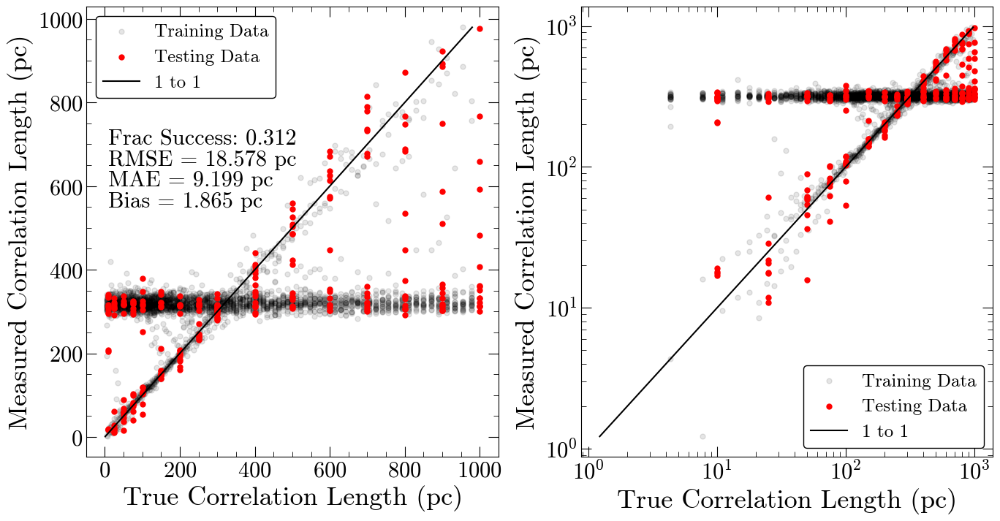

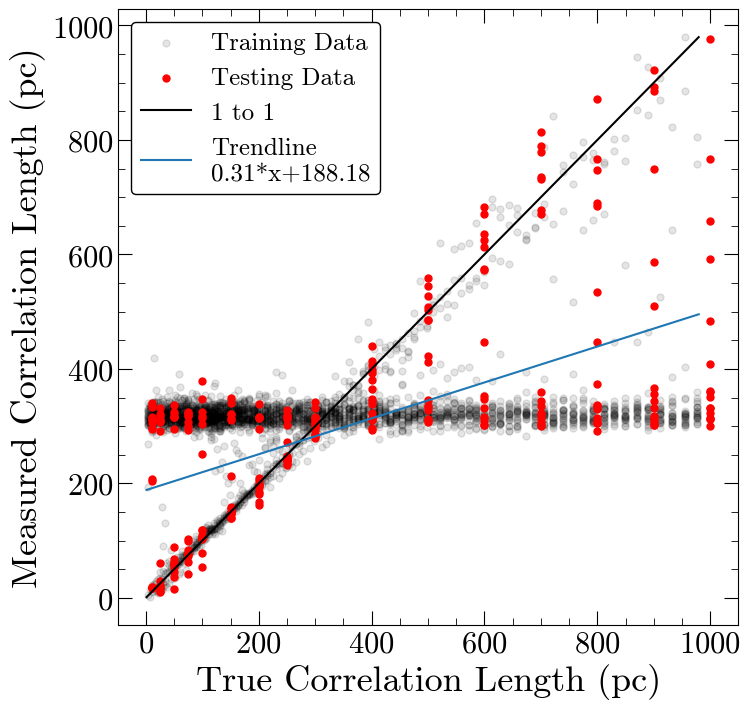

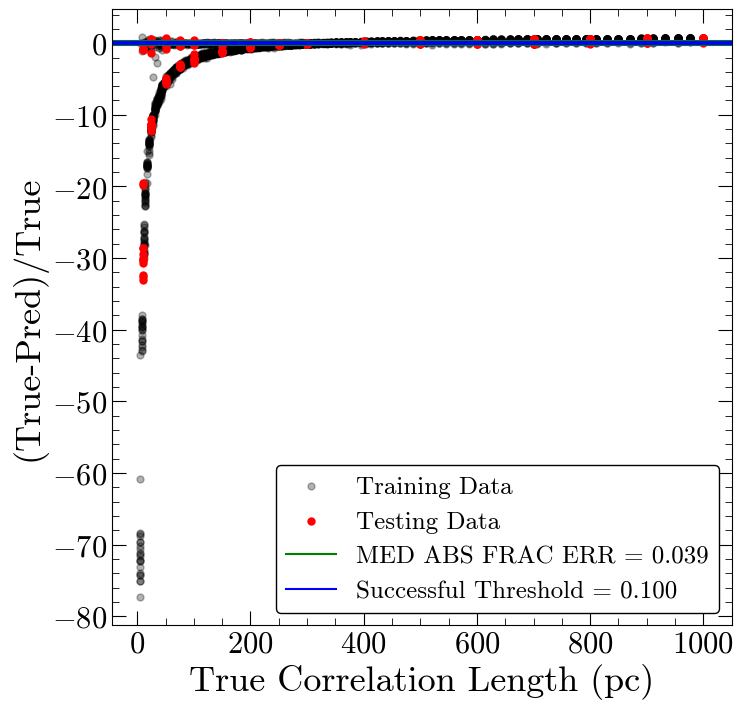

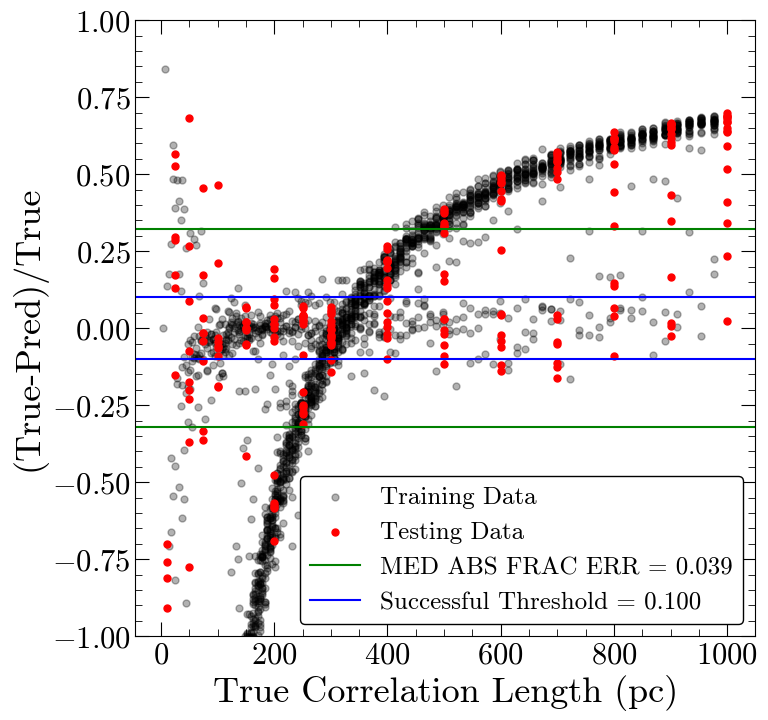

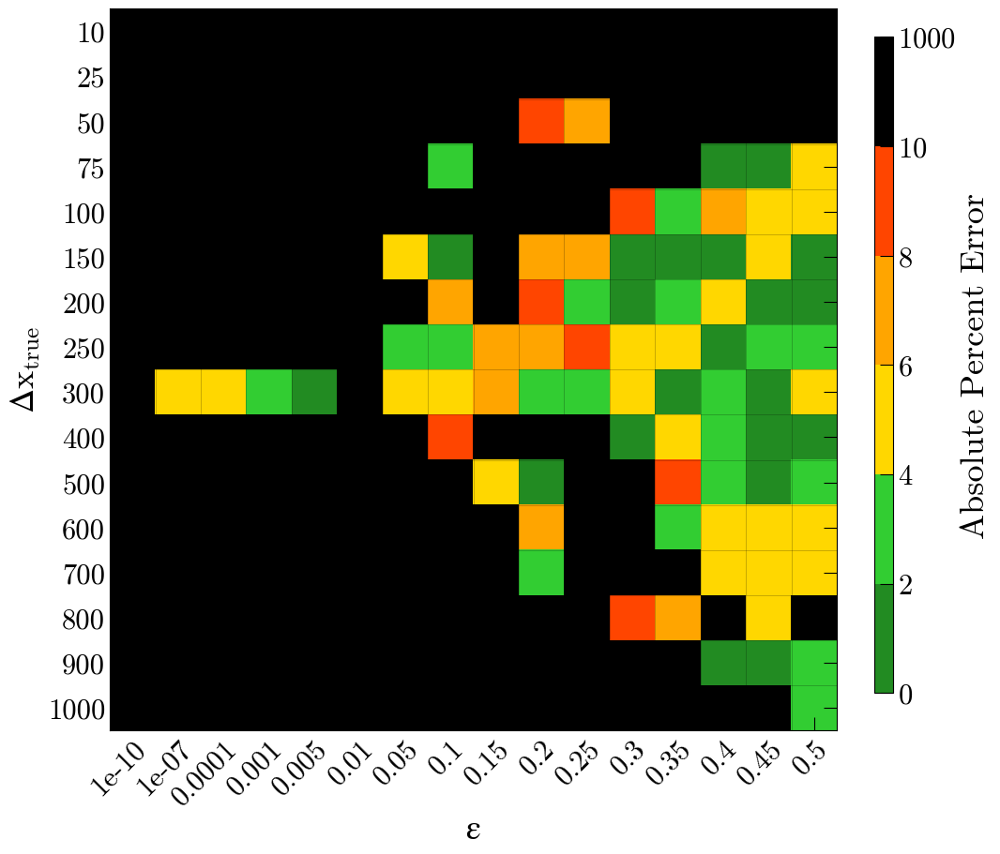

Number of squares with abs percent err>10%,  176


In [40]:
#model with more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 2s 11ms/step - loss: 98279.9219
Epoch 2/400
92/92 [==============================] - 1s 11ms/step - loss: 65136.7773
Epoch 3/400
92/92 [==============================] - 1s 10ms/step - loss: 64658.3828
Epoch 4/400
92/92 [==============================] - 1s 11ms/step - loss: 64786.1016
Epoch 5/400
92/92 [==============================] - 1s 11ms/step - loss: 64165.5273
Epoch 6/400
92/92 [==============================] - 1s 11ms/step - loss: 63725.6484
Epoch 7/400
92/92 [==============================] - 1s 10ms/step - loss: 63678.4453
Epoch 8/400
92/92 [==============================] - 1s 9ms/step - loss: 63766.5781
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 63387.1953
Epoch 10/400
92/92 [==============================] - 1s 11ms/step - loss: 63300.0820
Epoch 11/400
92/92 [==============================] - 1s 10ms/step - loss: 62945.0781
Epoch 12/400
92/92 [==============================] - 1s 9ms/ste

92/92 [==============================] - 1s 12ms/step - loss: 59142.2461
Epoch 191/400
92/92 [==============================] - 1s 12ms/step - loss: 58984.0508
Epoch 192/400
92/92 [==============================] - 1s 9ms/step - loss: 58770.2188
Epoch 193/400
92/92 [==============================] - 1s 10ms/step - loss: 58626.5469
Epoch 194/400
92/92 [==============================] - 1s 9ms/step - loss: 58619.7148
Epoch 195/400
92/92 [==============================] - 1s 9ms/step - loss: 58587.6797
Epoch 196/400
92/92 [==============================] - 1s 10ms/step - loss: 58705.9062
Epoch 197/400
92/92 [==============================] - 1s 9ms/step - loss: 58518.8359
Epoch 198/400
92/92 [==============================] - 1s 10ms/step - loss: 58839.7852
Epoch 199/400
92/92 [==============================] - 1s 9ms/step - loss: 58201.7617
Epoch 200/400
92/92 [==============================] - 1s 9ms/step - loss: 58933.5469
Epoch 201/400
92/92 [==============================] - 1s 9ms/s

92/92 [==============================] - 1s 11ms/step - loss: 57714.4648
Epoch 379/400
92/92 [==============================] - 1s 12ms/step - loss: 57782.3086
Epoch 380/400
92/92 [==============================] - 1s 12ms/step - loss: 58018.4141
Epoch 381/400
92/92 [==============================] - 1s 12ms/step - loss: 57914.2148
Epoch 382/400
92/92 [==============================] - 1s 13ms/step - loss: 57832.0234
Epoch 383/400
92/92 [==============================] - 1s 12ms/step - loss: 58106.1680
Epoch 384/400
92/92 [==============================] - 1s 12ms/step - loss: 57881.9961
Epoch 385/400
92/92 [==============================] - 1s 11ms/step - loss: 58218.8711
Epoch 386/400
92/92 [==============================] - 1s 11ms/step - loss: 57658.4336
Epoch 387/400
92/92 [==============================] - 1s 12ms/step - loss: 57656.8555
Epoch 388/400
92/92 [==============================] - 1s 12ms/step - loss: 57855.5781
Epoch 389/400
92/92 [==============================] - 1s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 239.516 pc
MAE: 169.804 pc
BIAS: -16.224 pc
MED FRAC ERR: 0.527 

Training Stats, Successful Fits
Frac Success Fit: 0.202 
RMSE: 19.126 pc
MAE: 10.583 pc
BIAS: 5.052 pc
MED FRAC ERR: 0.044 

Testing Stats
RMSE: 248.156 pc
MAE: 75.670 pc
BIAS: 7.702 pc
MED FRAC ERR: 0.255 

Testing Stats, Successful Fits
Frac Success Fit: 0.352 
RMSE: 22.533 pc
MAE: 10.090 pc
BIAS: 5.260 pc
MED FRAC ERR: 0.048 


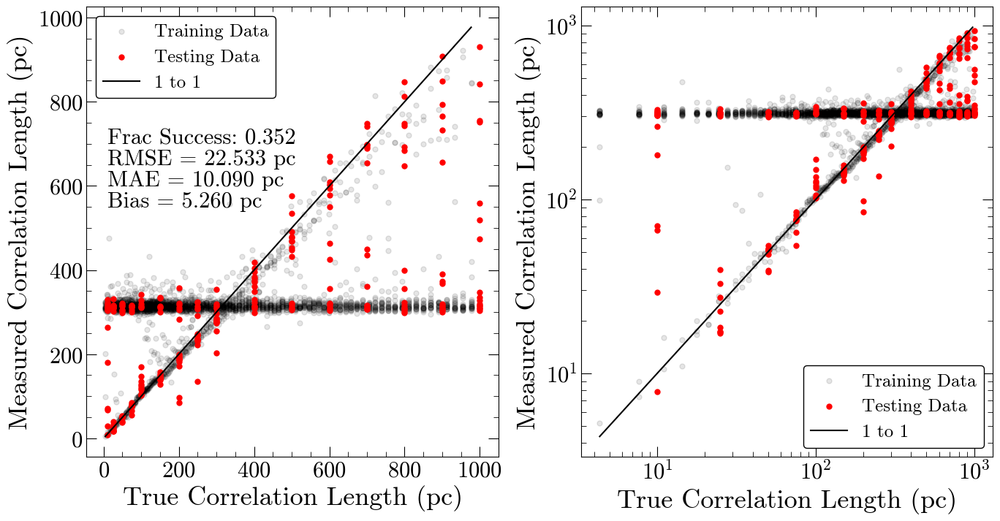

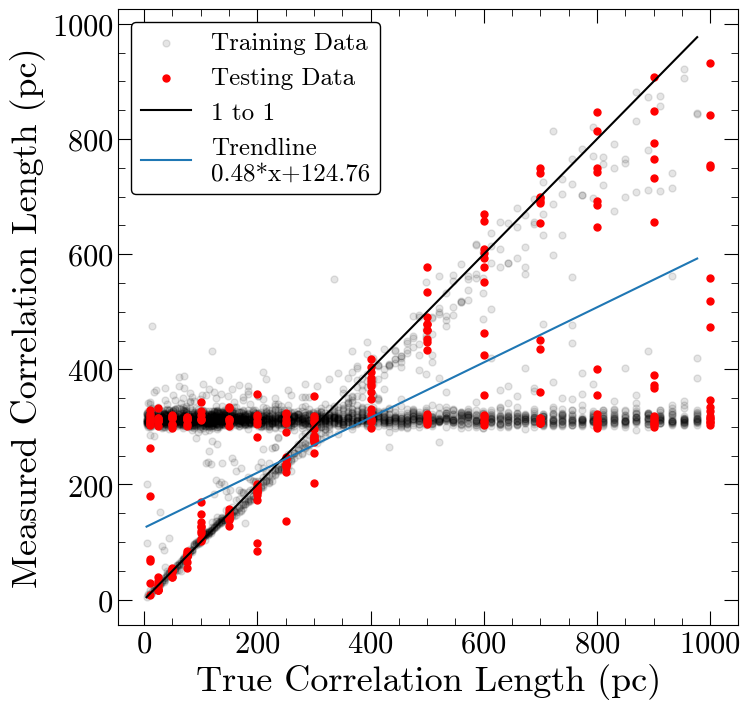

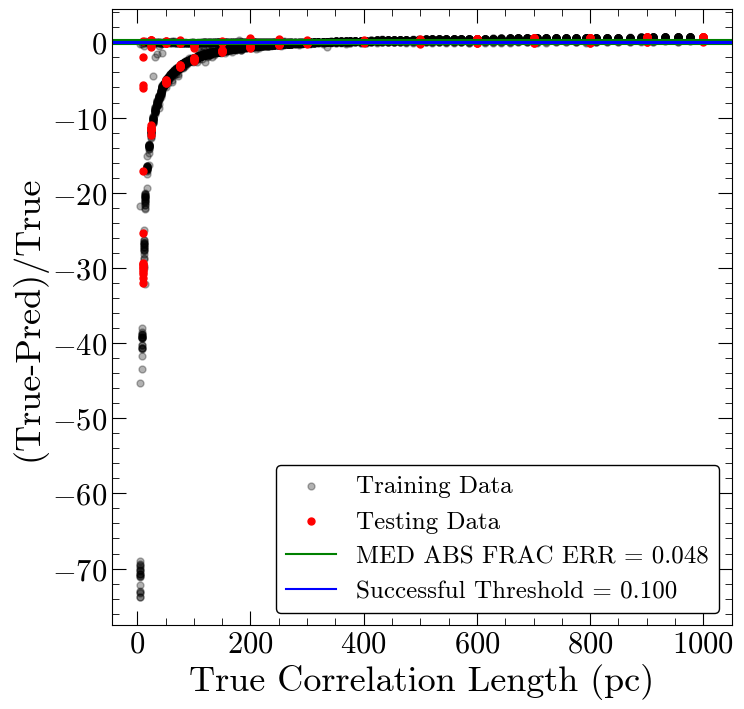

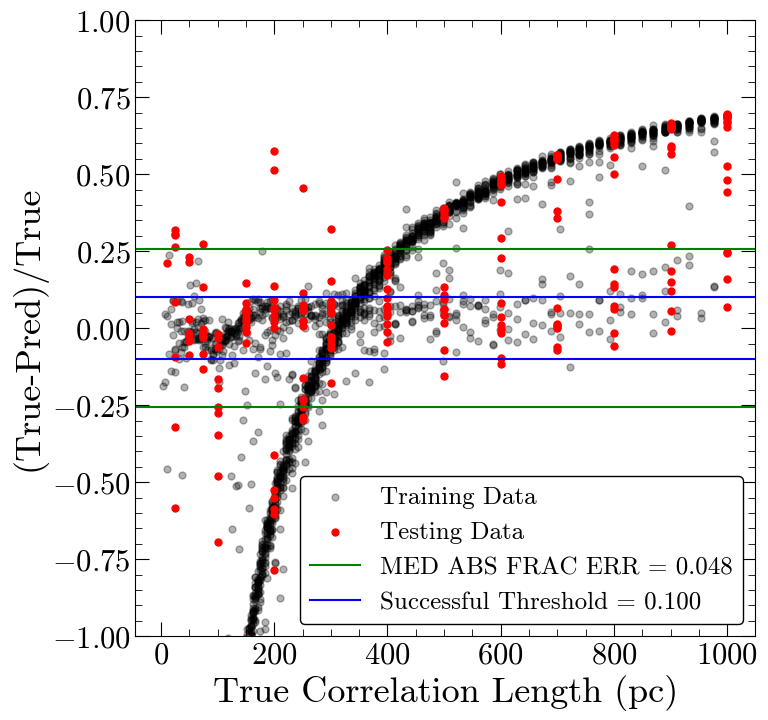

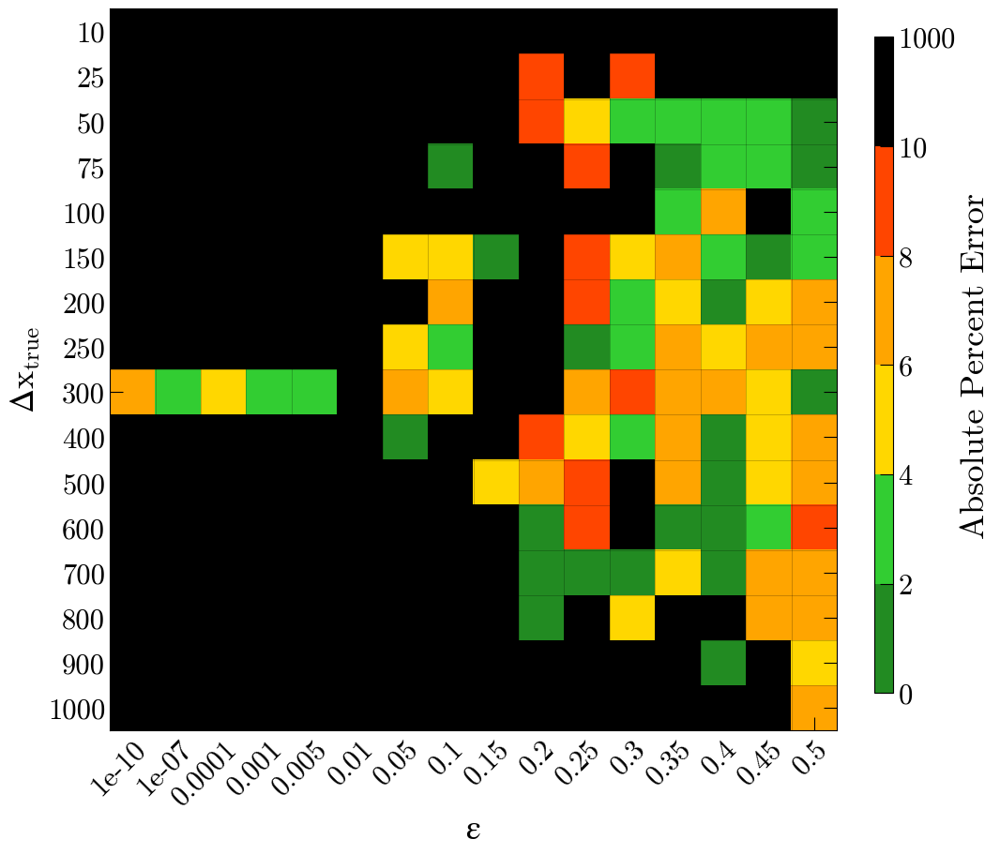

Number of squares with abs percent err>10%,  166


In [41]:
#model with even more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
46/46 [==============================] - 1s 17ms/step - loss: 142308.3125
Epoch 2/400
46/46 [==============================] - 1s 14ms/step - loss: 67943.3125
Epoch 3/400
46/46 [==============================] - 1s 13ms/step - loss: 64797.6328
Epoch 4/400
46/46 [==============================] - 1s 16ms/step - loss: 65012.1289
Epoch 5/400
46/46 [==============================] - 1s 15ms/step - loss: 64433.4297
Epoch 6/400
46/46 [==============================] - 1s 16ms/step - loss: 64275.4727
Epoch 7/400
46/46 [==============================] - 1s 13ms/step - loss: 63988.8203
Epoch 8/400
46/46 [==============================] - 1s 15ms/step - loss: 63853.5742
Epoch 9/400
46/46 [==============================] - 1s 13ms/step - loss: 63596.9453
Epoch 10/400
46/46 [==============================] - 1s 14ms/step - loss: 63693.2500
Epoch 11/400
46/46 [==============================] - 1s 13ms/step - loss: 63272.6836
Epoch 12/400
46/46 [==============================] - 1s 14ms/

46/46 [==============================] - 0s 10ms/step - loss: 58623.7969
Epoch 191/400
46/46 [==============================] - 0s 11ms/step - loss: 58712.4453
Epoch 192/400
46/46 [==============================] - 1s 11ms/step - loss: 59497.1211
Epoch 193/400
46/46 [==============================] - 1s 12ms/step - loss: 59251.6445
Epoch 194/400
46/46 [==============================] - 1s 11ms/step - loss: 58761.7734
Epoch 195/400
46/46 [==============================] - 1s 12ms/step - loss: 59032.5938
Epoch 196/400
46/46 [==============================] - 1s 11ms/step - loss: 59328.5586
Epoch 197/400
46/46 [==============================] - 1s 12ms/step - loss: 59370.5977
Epoch 198/400
46/46 [==============================] - 1s 12ms/step - loss: 59130.2266
Epoch 199/400
46/46 [==============================] - 1s 12ms/step - loss: 58960.1953
Epoch 200/400
46/46 [==============================] - 0s 9ms/step - loss: 58600.8633
Epoch 201/400
46/46 [==============================] - 0s 

46/46 [==============================] - 0s 9ms/step - loss: 57917.3047
Epoch 379/400
46/46 [==============================] - 0s 10ms/step - loss: 58113.6445
Epoch 380/400
46/46 [==============================] - 0s 9ms/step - loss: 57927.9805
Epoch 381/400
46/46 [==============================] - 0s 10ms/step - loss: 58532.8203
Epoch 382/400
46/46 [==============================] - 1s 11ms/step - loss: 58367.5273
Epoch 383/400
46/46 [==============================] - 0s 10ms/step - loss: 58244.8750
Epoch 384/400
46/46 [==============================] - 0s 9ms/step - loss: 58452.0156
Epoch 385/400
46/46 [==============================] - 0s 7ms/step - loss: 58048.1641
Epoch 386/400
46/46 [==============================] - 0s 9ms/step - loss: 58397.2891
Epoch 387/400
46/46 [==============================] - 0s 10ms/step - loss: 58201.6094
Epoch 388/400
46/46 [==============================] - 1s 11ms/step - loss: 57969.0039
Epoch 389/400
46/46 [==============================] - 0s 9ms/

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 241.347 pc
MAE: 160.664 pc
BIAS: -14.007 pc
MED FRAC ERR: 0.538 

Training Stats, Successful Fits
Frac Success Fit: 0.180 
RMSE: 17.504 pc
MAE: 8.277 pc
BIAS: 0.541 pc
MED FRAC ERR: 0.035 

Testing Stats
RMSE: 258.898 pc
MAE: 85.821 pc
BIAS: 1.295 pc
MED FRAC ERR: 0.266 

Testing Stats, Successful Fits
Frac Success Fit: 0.312 
RMSE: 21.855 pc
MAE: 5.911 pc
BIAS: -0.123 pc
MED FRAC ERR: 0.024 


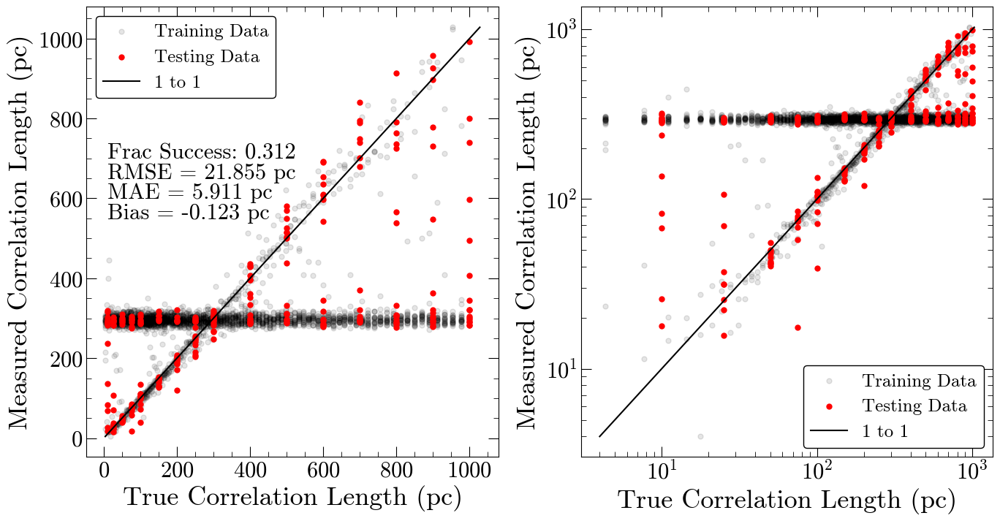

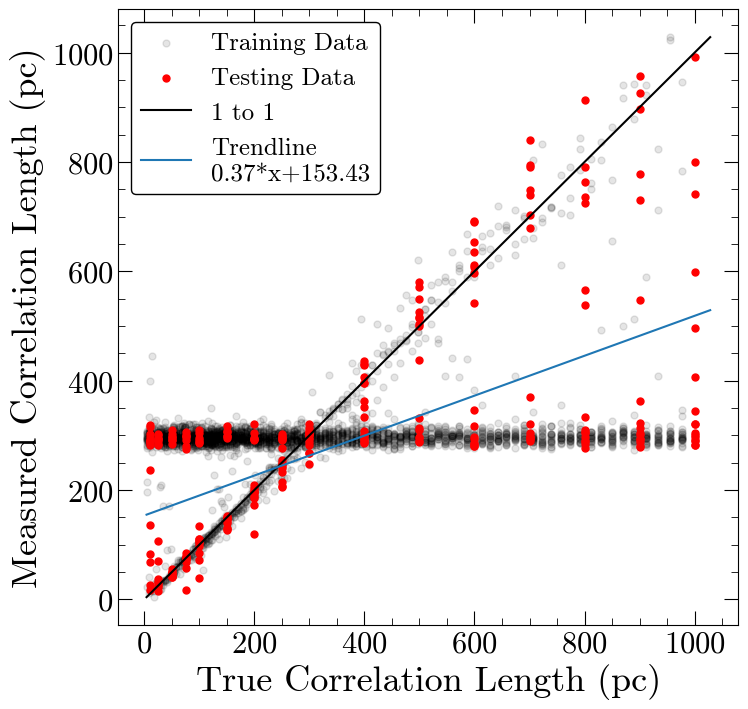

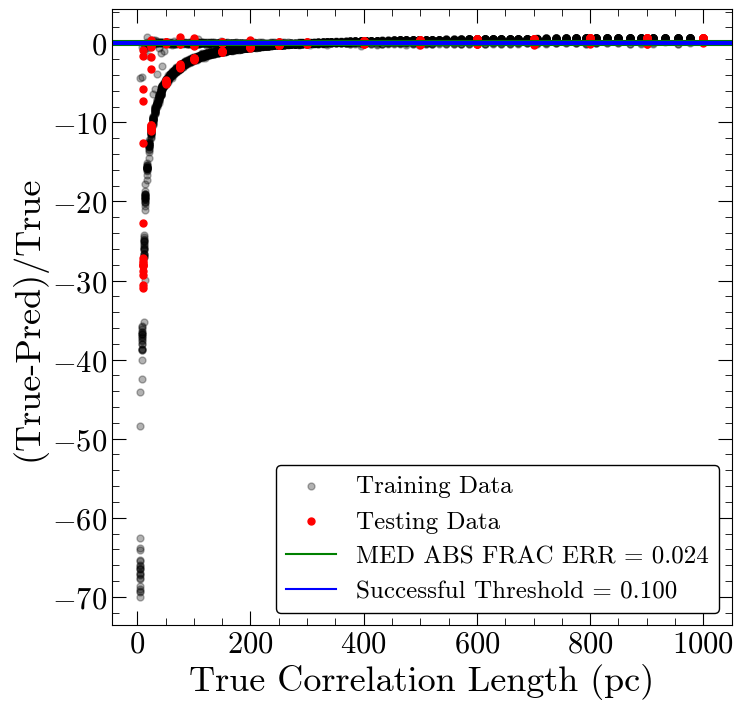

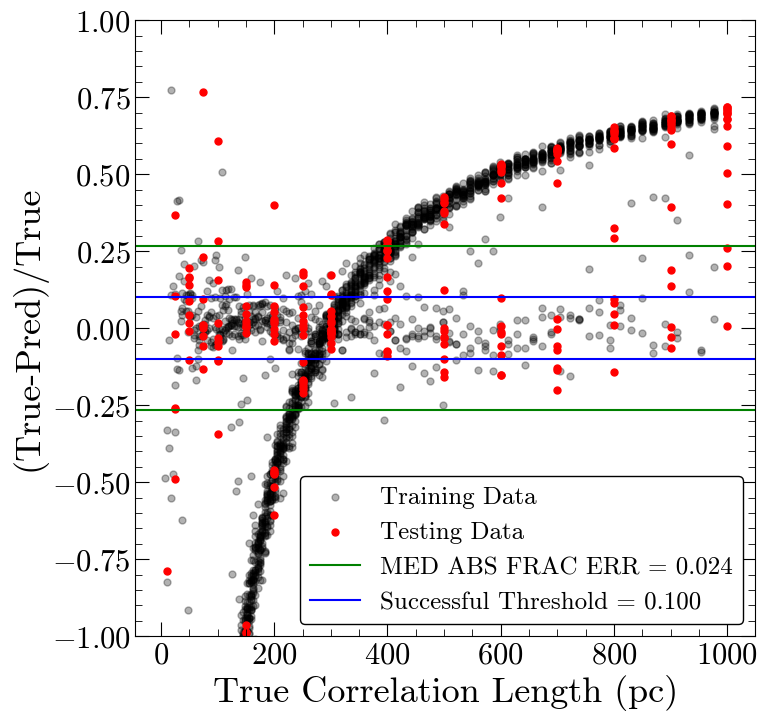

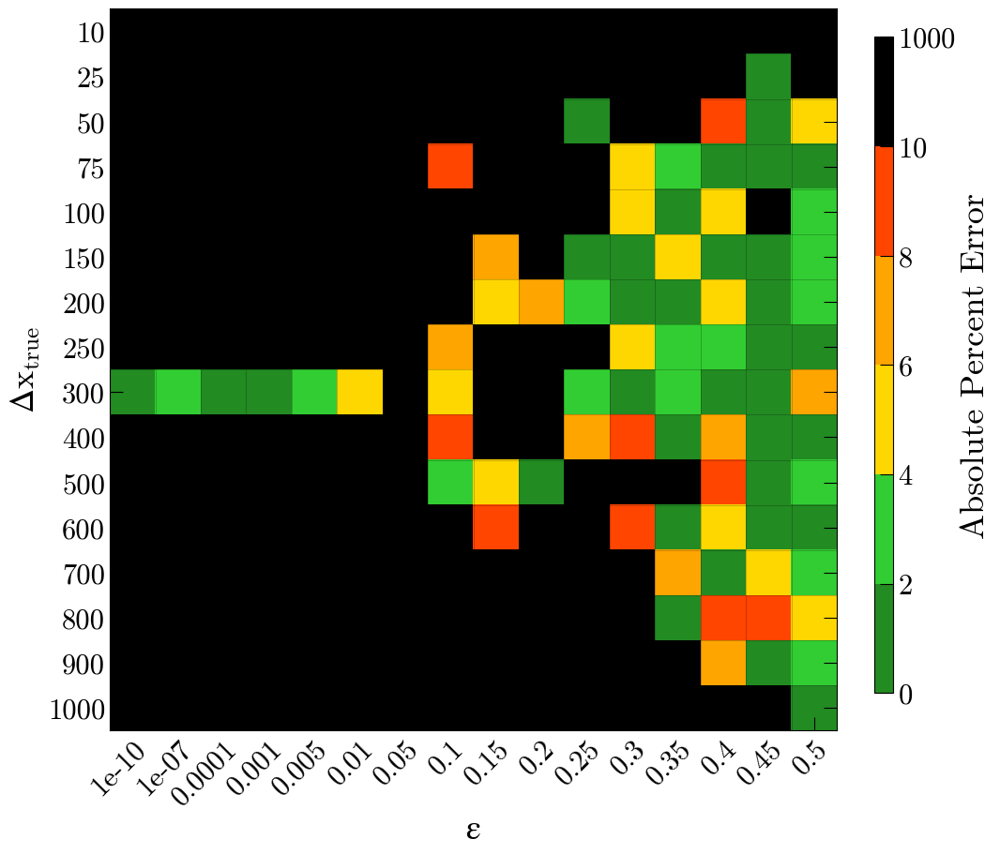

Number of squares with abs percent err>10%,  176


In [42]:
#model with even more layers, run for even more epochs, increase batch size
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=64)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
10/10 [==============================] - 0s 14ms/step - loss: 164046.2812
Epoch 2/400
10/10 [==============================] - 0s 13ms/step - loss: 158988.4375
Epoch 3/400
10/10 [==============================] - 0s 15ms/step - loss: 121696.4688
Epoch 4/400
10/10 [==============================] - 0s 17ms/step - loss: 75869.8828
Epoch 5/400
10/10 [==============================] - 0s 15ms/step - loss: 68326.9219
Epoch 6/400
10/10 [==============================] - 0s 15ms/step - loss: 66496.4453
Epoch 7/400
10/10 [==============================] - 0s 17ms/step - loss: 65427.7695
Epoch 8/400
10/10 [==============================] - 0s 14ms/step - loss: 65455.3867
Epoch 9/400
10/10 [==============================] - 0s 17ms/step - loss: 64765.1641
Epoch 10/400
10/10 [==============================] - 0s 15ms/step - loss: 64492.3906
Epoch 11/400
10/10 [==============================] - 0s 14ms/step - loss: 64379.1523
Epoch 12/400
10/10 [==============================] - 0s 14m

10/10 [==============================] - 0s 14ms/step - loss: 60066.6289
Epoch 191/400
10/10 [==============================] - 0s 13ms/step - loss: 59926.9766
Epoch 192/400
10/10 [==============================] - 0s 17ms/step - loss: 59729.5078
Epoch 193/400
10/10 [==============================] - 0s 16ms/step - loss: 59565.8203
Epoch 194/400
10/10 [==============================] - 0s 12ms/step - loss: 59937.1055
Epoch 195/400
10/10 [==============================] - 0s 14ms/step - loss: 59559.0117
Epoch 196/400
10/10 [==============================] - 0s 14ms/step - loss: 59724.5977
Epoch 197/400
10/10 [==============================] - 0s 14ms/step - loss: 59586.7500
Epoch 198/400
10/10 [==============================] - 0s 13ms/step - loss: 59573.1914
Epoch 199/400
10/10 [==============================] - 0s 14ms/step - loss: 59676.6328
Epoch 200/400
10/10 [==============================] - 0s 14ms/step - loss: 59738.7344
Epoch 201/400
10/10 [==============================] - 0s

10/10 [==============================] - 0s 10ms/step - loss: 59381.0430
Epoch 379/400
10/10 [==============================] - 0s 10ms/step - loss: 59307.8984
Epoch 380/400
10/10 [==============================] - 0s 10ms/step - loss: 59080.6289
Epoch 381/400
10/10 [==============================] - 0s 10ms/step - loss: 59313.3242
Epoch 382/400
10/10 [==============================] - 0s 10ms/step - loss: 59273.4062
Epoch 383/400
10/10 [==============================] - 0s 10ms/step - loss: 59419.2617
Epoch 384/400
10/10 [==============================] - 0s 10ms/step - loss: 58800.6289
Epoch 385/400
10/10 [==============================] - 0s 10ms/step - loss: 59188.7109
Epoch 386/400
10/10 [==============================] - 0s 10ms/step - loss: 59117.1367
Epoch 387/400
10/10 [==============================] - 0s 10ms/step - loss: 59172.3984
Epoch 388/400
10/10 [==============================] - 0s 10ms/step - loss: 59009.0078
Epoch 389/400
10/10 [==============================] - 0s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 243.441 pc
MAE: 185.147 pc
BIAS: -55.060 pc
MED FRAC ERR: 0.544 

Training Stats, Successful Fits
Frac Success Fit: 0.177 
RMSE: 17.317 pc
MAE: 8.144 pc
BIAS: -3.534 pc
MED FRAC ERR: 0.039 

Testing Stats
RMSE: 257.145 pc
MAE: 105.697 pc
BIAS: -4.004 pc
MED FRAC ERR: 0.305 

Testing Stats, Successful Fits
Frac Success Fit: 0.309 
RMSE: 22.691 pc
MAE: 6.628 pc
BIAS: -2.381 pc
MED FRAC ERR: 0.034 


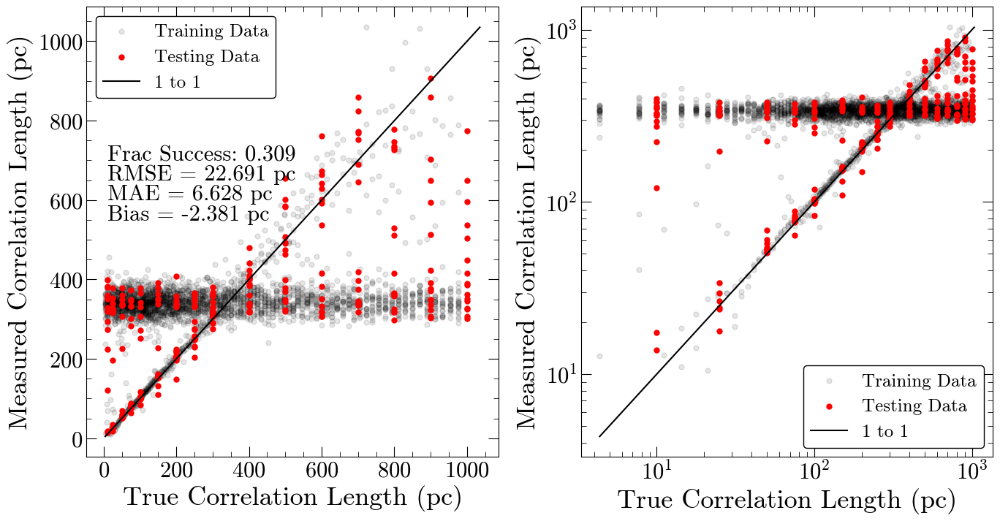

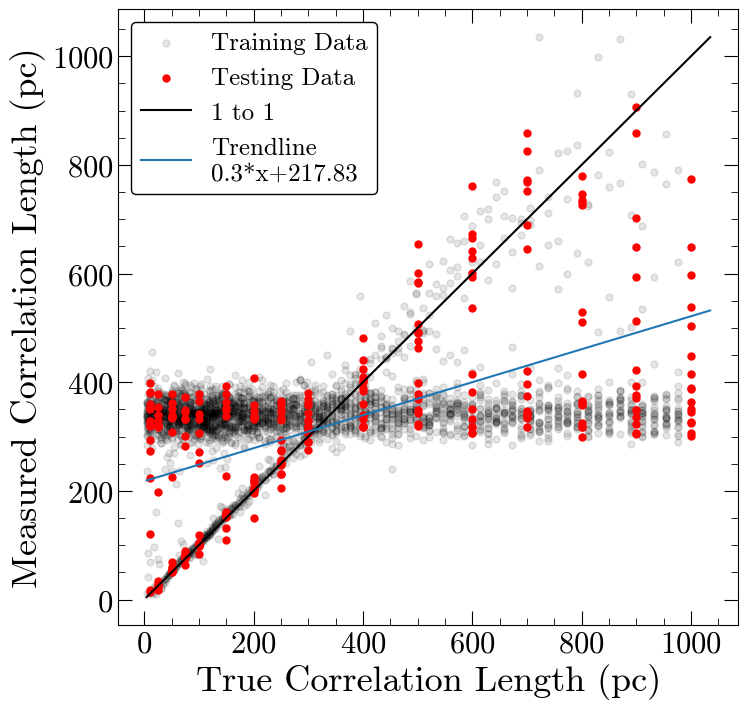

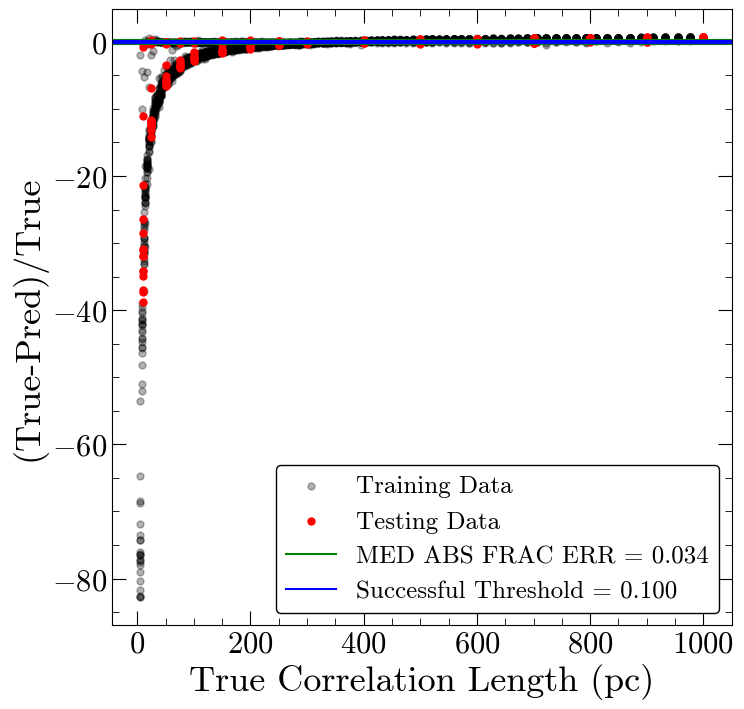

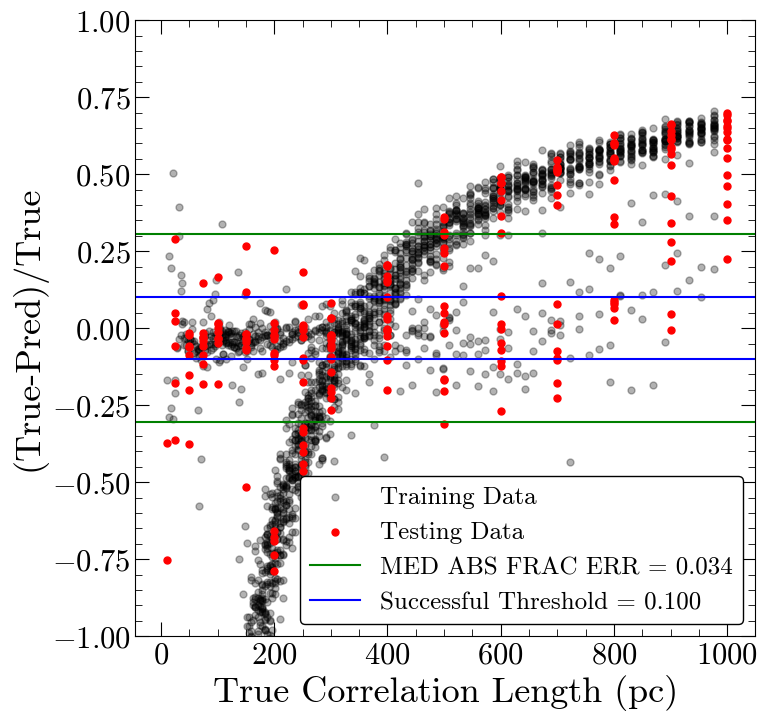

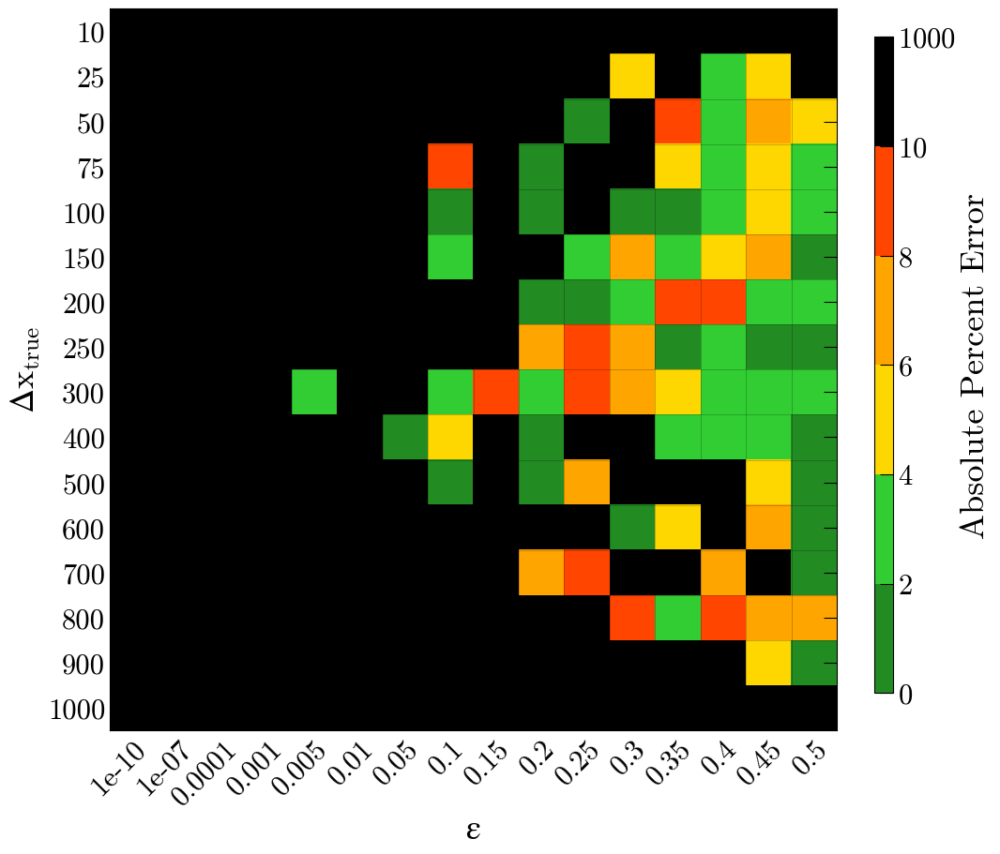

Number of squares with abs percent err>10%,  177


In [43]:
#model with even more layers, run for even more epochs, increase batch size even more
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=300)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

# Save best model

In [44]:
#reset the indices
indices=np.arange(0,len(all_model_stats))
all_model_stats.set_index(indices,inplace=True)
#round all values
all_model_stats=all_model_stats.round(2)

print('Min MAE Training')
print(all_model_stats['mae_training'].idxmin(),', min val=',min(all_model_stats['mae_training']))
print('')

print('Max Frac Success Training')
print(all_model_stats['frac_success_training'].idxmax(),', max val=',max(all_model_stats['frac_success_training']))
print('')

print('Min MAE Testing')
print(all_model_stats['mae_testing'].idxmin(),', min val=',min(all_model_stats['mae_testing']))
print('')

print('Max Frac Success Testing')
print(all_model_stats['frac_success_testing'].idxmax(),', max val=',max(all_model_stats['frac_success_testing']))
print('')

display(all_model_stats)

#best model option is 8


Min MAE Training
1 , min val= 157.96

Max Frac Success Training
8 , max val= 0.2

Min MAE Testing
8 , min val= 75.67

Max Frac Success Testing
8 , max val= 0.35



,mae_training,frac_success_training,mae_testing,frac_success_testing
0,162.05,0.14,145.91,0.25
1,157.96,0.15,128.98,0.25
2,166.47,0.16,115.86,0.30
3,195.62,0.17,113.01,0.26
4,159.98,0.12,120.46,0.21
5,178.52,0.15,120.37,0.24
6,173.10,0.16,103.70,0.29
7,171.50,0.18,81.18,0.31
8,169.80,0.20,75.67,0.35
9,160.66,0.18,85.82,0.31


In [46]:
#choose model 8 which is the best option across all runs

failed_fit_region_count=500

while failed_fit_region_count>166:
    #model with even more layers, run for even more epochs
    final_model = Sequential([
        Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
        MaxPooling1D(2), 
        Conv1D(64, 3, activation='relu'),
        MaxPooling1D(2), 
        Conv1D(128, 3, activation='relu'), 
        MaxPooling1D(2), 
        Flatten(), 
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1) 
    ])

    final_model.compile(optimizer='adam', loss='mse')

    final_model.fit(x_train, y_train, epochs=400, batch_size=32)

    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(final_model,stats=False,plot=False)
    
    print('')
    print(failed_fit_region_count)
    print('')

Epoch 1/400
92/92 [==============================] - 2s 13ms/step - loss: 93450.1562
Epoch 2/400
92/92 [==============================] - 1s 13ms/step - loss: 64907.4492
Epoch 3/400
92/92 [==============================] - 2s 17ms/step - loss: 64309.0391
Epoch 4/400
92/92 [==============================] - 2s 17ms/step - loss: 64010.1602
Epoch 5/400
92/92 [==============================] - 1s 15ms/step - loss: 63748.6250
Epoch 6/400
92/92 [==============================] - 1s 16ms/step - loss: 63561.2695
Epoch 7/400
92/92 [==============================] - 1s 16ms/step - loss: 63686.1797
Epoch 8/400
92/92 [==============================] - 1s 13ms/step - loss: 62958.6289
Epoch 9/400
92/92 [==============================] - 1s 13ms/step - loss: 63367.5156
Epoch 10/400
92/92 [==============================] - 2s 22ms/step - loss: 62492.4062
Epoch 11/400
92/92 [==============================] - 2s 18ms/step - loss: 62042.9375
Epoch 12/400
92/92 [==============================] - 2s 17ms/s

92/92 [==============================] - 2s 18ms/step - loss: 58973.8320
Epoch 191/400
92/92 [==============================] - 2s 19ms/step - loss: 58805.6055
Epoch 192/400
92/92 [==============================] - 2s 18ms/step - loss: 59260.7500
Epoch 193/400
92/92 [==============================] - 2s 16ms/step - loss: 58857.0781
Epoch 194/400
92/92 [==============================] - 2s 17ms/step - loss: 58643.9180
Epoch 195/400
92/92 [==============================] - 2s 17ms/step - loss: 58706.4531
Epoch 196/400
92/92 [==============================] - 2s 17ms/step - loss: 58914.1289
Epoch 197/400
92/92 [==============================] - 1s 16ms/step - loss: 58770.8203
Epoch 198/400
92/92 [==============================] - 2s 18ms/step - loss: 58795.5078
Epoch 199/400
92/92 [==============================] - 2s 18ms/step - loss: 59534.3750
Epoch 200/400
92/92 [==============================] - 2s 17ms/step - loss: 58890.1328
Epoch 201/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 13ms/step - loss: 57955.3516
Epoch 379/400
92/92 [==============================] - 1s 13ms/step - loss: 58359.9688
Epoch 380/400
92/92 [==============================] - 1s 14ms/step - loss: 58015.3555
Epoch 381/400
92/92 [==============================] - 1s 14ms/step - loss: 58175.4180
Epoch 382/400
92/92 [==============================] - 1s 15ms/step - loss: 58218.3477
Epoch 383/400
92/92 [==============================] - 1s 13ms/step - loss: 58040.4336
Epoch 384/400
92/92 [==============================] - 1s 15ms/step - loss: 58155.9023
Epoch 385/400
92/92 [==============================] - 1s 14ms/step - loss: 58071.0820
Epoch 386/400
92/92 [==============================] - 1s 13ms/step - loss: 58329.6016
Epoch 387/400
92/92 [==============================] - 1s 14ms/step - loss: 58184.5508
Epoch 388/400
92/92 [==============================] - 1s 13ms/step - loss: 57960.5938
Epoch 389/400
92/92 [==============================] - 1s

In [47]:
#save the model
nb='09'
final_model.save('csv/nb05_sample_size_10207/'+nb+'_final_model')

INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/09_final_model/assets


INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/09_final_model/assets


In [50]:
def final_plot(nb,title,statx=10,staty=700,statdy=50,lim='default', siegel=True,success_fit_threshold=0.1):
    
    loaded_model = load_model('csv/nb05_sample_size_10207/'+nb+'_final_model')
    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(loaded_model,stats=False,plot=False)
    
    # use the model to predict the training data
    y_pred_train = loaded_model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the training data
    y_pred_test = loaded_model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,False)
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,False,True,success_fit_threshold)
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,False)
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold)
    
    #plot the agreement with stats
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(8,16),sharex=True)
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_ylabel(r'Predicted Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    
    # plot the fractional error between the datasets zoomed in
    ax2.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax2.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax2.axhline(0,color='black')
    ax2.axhline(med_frac_testing,color='green',label='Median Absolute\nFractional Error = {:.3f}'.format(med_frac_testing_success))
    ax2.axhline(-med_frac_testing,color='green')
    ax2.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.1f}'.format(success_fit_threshold))
    ax2.axhline(-success_fit_threshold,color='blue')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'($\lambda_{True}-\lambda_{Pred})/\lambda_{True}$')
    ax2.set_ylim((-1,1))
    ax2.legend()
    
    ax1.set_title(title)
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    plt.show()
    
    #make and save the heatmap, which is the figure that will be included in the paper
    failed_fit_region_count=heatmap_testing_data(testing_data,title,savefig=True,figname=nb+'_cnn_heatmap')
    

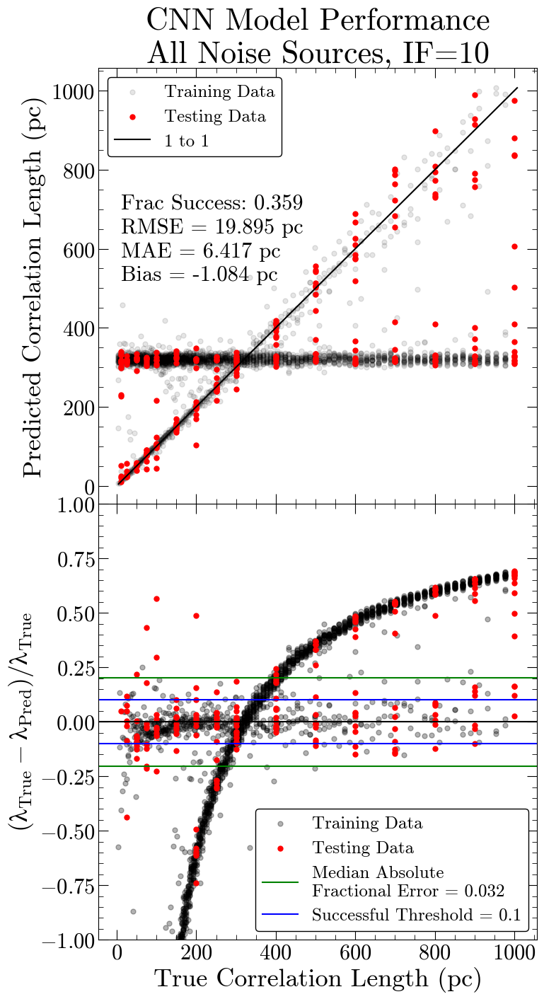

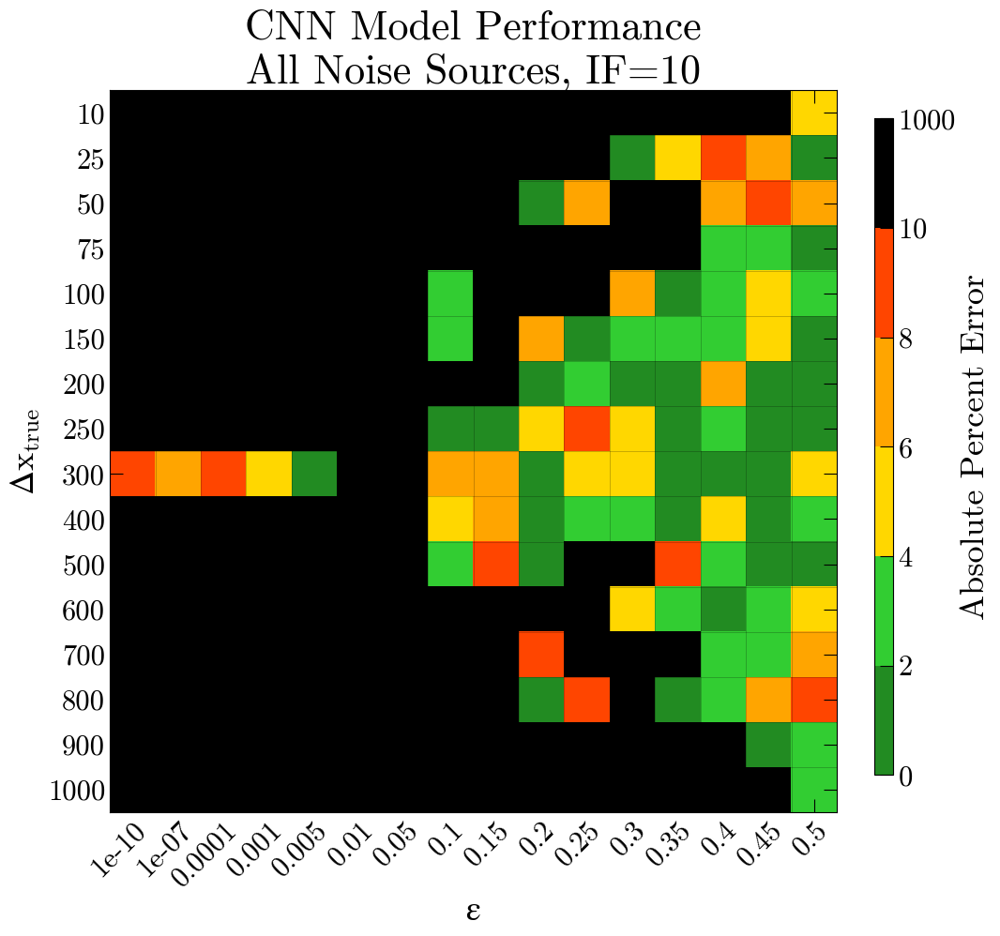

Number of squares with abs percent err>10%,  164


In [51]:
final_plot('09','CNN Model Performance\nAll Noise Sources, IF=10',statdy=60)